In [29]:
import sys,os,os.path
sys.path.append("../../../") # if you move files around, you need to adjust this!
sys.path.append(os.path.expanduser('~/code/eol_hsrl_python'))
os.environ['ICTDIR']='/home/e78368jw/Documents/NEXT_CODE/IC'

#%load_ext autoreload
#%autoreload 2
#%matplotlib notebook

import matplotlib.pyplot as plt
from matplotlib import rcParams
rcParams['mathtext.fontset'] = 'stix'
rcParams['font.family'] = 'STIXGeneral'
rcParams['figure.figsize'] = [10, 8]
rcParams['font.size'] = 22

import pandas as pd
import numpy  as np
import tables as tb

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.colors as clrs

import IC.invisible_cities.core.core_functions                   as     coref
import IC.invisible_cities.io.dst_io                           as     dstio

from IC.invisible_cities.cities                 import beersheba as beerfun

from IC.invisible_cities.evm.event_model                          import HitCollection

from IC.invisible_cities.database.load_db       import DataSiPM

from IC.invisible_cities.evm.event_model        import Cluster, Hit
from IC.invisible_cities.types.ic_types         import xy
from IC.invisible_cities.reco.paolina_functions import voxelize_hits

from IC.invisible_cities.evm.event_model        import HitEnergy
from IC.invisible_cities.cities.beersheba          import DeconvolutionMode
from IC.invisible_cities.cities.beersheba          import CutType

from IC.invisible_cities.reco import hits_functions as hif

from IC.invisible_cities.reco.deconv_functions import deconvolve
from IC.invisible_cities.reco.deconv_functions import deconvolution_input
from IC.invisible_cities.reco.deconv_functions import InterpolationMethod

import IC.invisible_cities.io.mcinfo_io as mcio

from collections import defaultdict

import matplotlib.cm as cm
from matplotlib.colors import Normalize



In [30]:

def threshold_hits(threshold_charge, same_peak, hitc):
    """
    Applies a threshold to hits and redistributes the charge/energy.

    Parameters
    ----------
    threshold_charge : float
        minimum pes of a hit
    same_peak        : bool
        whether to reassign NN hits' energy only to the hits from the same peak

    Returns
    ----------
    A function that takes HitCollection as input and returns another object with
    only non NN hits of charge above threshold_charge.
    The energy of NN hits is redistributed among neighbors.
    """

    t = hitc.time
    thr_hits = hif.threshold_hits(hitc.hits, threshold_charge     )
    mrg_hits = hif.merge_NN_hits ( thr_hits, same_peak = same_peak)

    cor_hits = []
    for hit in mrg_hits:
        cluster = Cluster(hit.Q, xy(hit.X, hit.Y), hit.var, hit.nsipm)
        xypos   = xy(hit.Xpeak, hit.Ypeak)
        hit     = Hit(hit.npeak, cluster, hit.Z, hit.E, xypos, hit.Ec)
        cor_hits.append(hit)

    new_hitc      = HitCollection(hitc.event, t)
    new_hitc.hits = cor_hits
    return new_hitc





def hits_from_df (dst, skip_NN = False):
    """
    Function that transforms pandas DataFrame dst to HitCollection
    ------
    Parameters
    ------
    dst : pd.DataFrame
        DataFrame with obligatory columns :
                event, npeak, X, Y, Z,  Q, E
        If time, nsipm, Xrms, Yrms, Qc, Ec, track_id are not
        inside dst the default value is set to -1
        If Xpeak, Ypeak not in dst the default value is -1000
    ------
    Returns
    ------
    Dictionary {event_number : HitCollection}
    from here
    https://github.com/next-exp/IC/blob/v2-development/invisible_cities/io/hits_io.py#L16
    """
    all_events = {}
    times = getattr(dst, 'time', [-1]*len(dst))
    for (event, time) , df in dst.groupby(['event', times]):
        #pandas is not consistent with numpy dtypes so we have to change it by hand
        event = np.int32(event)
        hits  = []
        for i, row in df.iterrows():
            Q = getattr(row,'Q', row.E)
            if skip_NN and Q == NN:
                continue
            if hasattr(row, 'Xrms'):
                Xrms  = row.Xrms
                Xrms2 = Xrms**2
            else:
                Xrms = Xrms2 = -1
            if hasattr(row, 'Yrms'):
                Yrms  = row.Yrms
                Yrms2 = Yrms**2
            else:
                Yrms = Yrms2 = -1
            nsipm   = getattr(row, 'nsipm'   , -1   )     # for backwards compatibility
            Qc      = getattr(row, 'Qc'      , -1   )     # for backwards compatibility
            Xpeak   = getattr(row, 'Xpeak'   , -1000)     # for backwards compatibility
            Ypeak   = getattr(row, 'Ypeak'   , -1000)     # for backwards compatibility
            Ec      = getattr(row, 'Ec'      , -1   )     # for backwards compatibility
            trackID = getattr(row, 'track_id', -1   )     # for backwards compatibility
            Ep      = getattr(row, "Ep"      , -1   )     # for backwards compatibility

            hit = Hit(row.npeak            ,
                      Cluster(Q               ,
                              xy(row.X, row.Y),
                              xy(Xrms2, Yrms2),
                              nsipm = nsipm   ,
                              z     = row.Z   ,
                              E     = row.E   ,
                              Qc    = Qc      ),
                      row.Z                ,
                      row.E                ,
                      xy(Xpeak, Ypeak)     ,
                      s2_energy_c = Ec     ,
                      track_id    = trackID,
                      Ep          = Ep     )

            hits.append(hit)

        if len(hits):
            all_events[event] = HitCollection(event, time, hits=hits)

    return all_events

def hitc_to_df_(hitc):
    columns = defaultdict(list)
    for hit in hitc.hits:
        columns["event"   ].append(hitc.event)
        columns["time"    ].append(hitc.time)
        columns["npeak"   ].append(hit .npeak)
        columns["Xpeak"   ].append(hit .Xpeak)
        columns["Ypeak"   ].append(hit .Ypeak)
        columns["nsipm"   ].append(hit .nsipm)
        columns["X"       ].append(hit .X)
        columns["Y"       ].append(hit .Y)
        columns["Xrms"    ].append(hit .Xrms)
        columns["Yrms"    ].append(hit .Yrms)
        columns["Z"       ].append(hit .Z)
        columns["Q"       ].append(hit .Q)
        columns["E"       ].append(hit .E)
        columns["Qc"      ].append(hit .Qc)
        columns["Ec"      ].append(hit .Ec)
        columns["track_id"].append(hit .track_id)
        columns["Ep"      ].append(hit .Ep)
    return pd.DataFrame(columns)






def soph_to_lowTh(df, threshold = 5, verbose = True):
    '''
    Converts sophronia 'RECO/Events' to lowTh events via a rather convoluted process
    Made by me (John Waiton), so dont treat it like a normal function from IC!
    ------
    Parameters
    ------
    df : pd.DataFrame
        DataFrame with obligatory columns :
                event, npeak, X, Y, Z,  Q, E
    threshold: int
        value at which the threshold is set.
    ------
    Returns
    ------
    Dictionary {event_number : HitCollection}
    from here
    '''



    # new parameters for threshold, this is silly but I'm copying previous convention
    pes = 1
    threshold = threshold * pes
    same_peak = True

    # convert sophronia RECO/Events to hit collection
    soph_hitc = hits_from_df(df)

    # collect the keys as the event numbers
    soph_hitc_list = list(soph_hitc.keys())
    if (verbose == True):
        print("Processing data...")
    # loop over all of these events
    j = 0
    for i in soph_hitc_list:
        j += 1

        if (verbose == True):
            if (len(soph_hitc_list)%j == 50): 
                print("{}/{}".format(j, len(soph_hitc_list)))
        # choose i'th event
        soph_hit_event = soph_hitc.get(i)

        # Apply threshold calculation
        soph_hitc_lowTh = threshold_hits(threshold, same_peak, soph_hit_event)

        # convert back to pandas dataframe using hitc_to_df
        soph_hdst_lowTh = hitc_to_df_(soph_hitc_lowTh)

        # check if pandas dataframe with all the events exists yet
        if 'full_soph_df' in locals() and isinstance(full_soph_df, pd.DataFrame):
            full_soph_df = pd.concat([full_soph_df, soph_hdst_lowTh])
        else:
            full_soph_df = soph_hdst_lowTh.copy(deep = True)
    
    return full_soph_df

### IMPORTING ALL THE RELEVANT INFORMATION WE DESIRE

In [41]:
# sophronia q_thr 1,3,5 files.
directory = f'../sophronia/'

soph_array =    ['sophronia_1_0nubb_qthr3_mu1.h5', 
                 'sophronia_1_0nubb_qthr3_mu2.h5', 
                 'sophronia_1_0nubb_qthr3_mu3.h5']

pre_dir_name = '../sophronia/sophronia_plots_mu/'

thresholds = [1,2,3]



In [37]:
# loading in MC, should be identical across all 3 directories
MC = pd.read_hdf(directory + soph_array[0], 'MC/particles')
MC['event_id'] = MC['event_id'].apply(lambda x: x*2)


In [35]:
# load the data
mu1 = dstio.load_dst(directory + soph_array[0], 'RECO', 'Events')
mu2 = dstio.load_dst(directory + soph_array[1], 'RECO', 'Events')
mu3 = dstio.load_dst(directory + soph_array[2], 'RECO', 'Events')

event_list = (mu1['event'].unique())

In [36]:
print("The events we're going to look at:\n")
print(event_list)

The events we're going to look at:

[  0   2   4   6   8  10  12  14  16  18  20  22  24  26  28  30  32  34
  36  38  40  42  44  46  48  50  52  54  56  58  60  62  64  66  68  70
  72  74  76  78  80  82  84  86  88  90  92  94  96  98 100 102 104 106
 108 110 112 114 116 118 120 122 124 126 128 130 132 134 136 138 140 142
 144 146 148 150 152 154 156 158 160 162 164 166 168 170 172 174 176 178
 180 182 184 186 188 190 192 194 196 198 200 202 204 206 208 210 212 214
 216 218 220 222 224 226 228 230 232 234 236 238 240 242 244 246 248 250
 252 254 256 258 260 262 264 266 268 270 272 274 276 278 280 282 284 286
 288 290 292 294 296 298 300 302 304 306 308 310 312 314 316 318 320 322
 324 326 328 330 332 334 336 338 340 342 344 346 348 350 352 354 356 358
 360 362 364 366 368 370 372 374 376 378 380 382 384 386 388 390 392 394
 396 398 400 402 404 406 408 410 412 414 416 418 420 422 424 426 428 430
 432 434 436 438 440 442 444 446 448 450 452 454 456 458 460 462]


(0/100)
(2/100)
(4/100)
(6/100)
(8/100)
(10/100)
(12/100)
(14/100)
(16/100)
(18/100)
(20/100)
(22/100)
(24/100)
(26/100)
(28/100)
(30/100)
(32/100)
(34/100)
(36/100)
(38/100)
(40/100)


/tmp/ipykernel_42100/3932045181.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(1, 3, figsize=(18, 4))


(42/100)
(44/100)
(46/100)
(48/100)
(50/100)
(52/100)
(54/100)
(56/100)
(58/100)
(60/100)
(62/100)
(64/100)
(66/100)
(68/100)
(70/100)
(72/100)
(74/100)
(76/100)
(78/100)
(80/100)
(82/100)
(84/100)
(86/100)
(88/100)
(90/100)
(92/100)
(94/100)
(96/100)
(98/100)
(100/100)
(102/100)
(104/100)
(106/100)
(108/100)
(110/100)
(112/100)
(114/100)
(116/100)
(118/100)
(120/100)
(122/100)
(124/100)
(126/100)
(128/100)
(130/100)
(132/100)
(134/100)
(136/100)
(138/100)
(140/100)
(142/100)
(144/100)
(146/100)
(148/100)
(150/100)
(152/100)
(154/100)
(156/100)
(158/100)
(160/100)
(162/100)
(164/100)
(166/100)
(168/100)
(170/100)
(172/100)
(174/100)
(176/100)
(178/100)
(180/100)
(182/100)
(184/100)
(186/100)
(188/100)
(190/100)
(192/100)
(194/100)
(196/100)
(198/100)


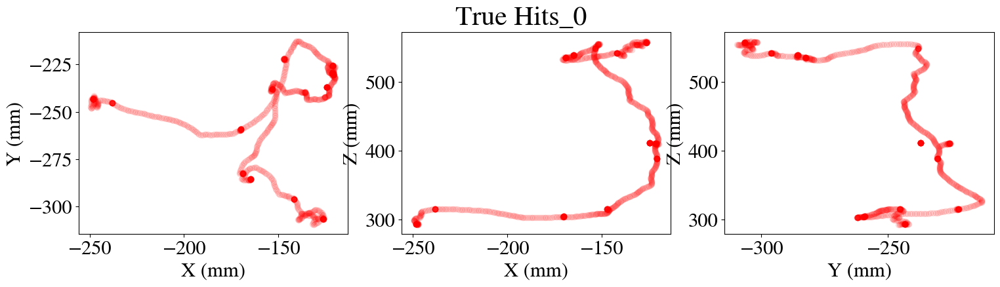

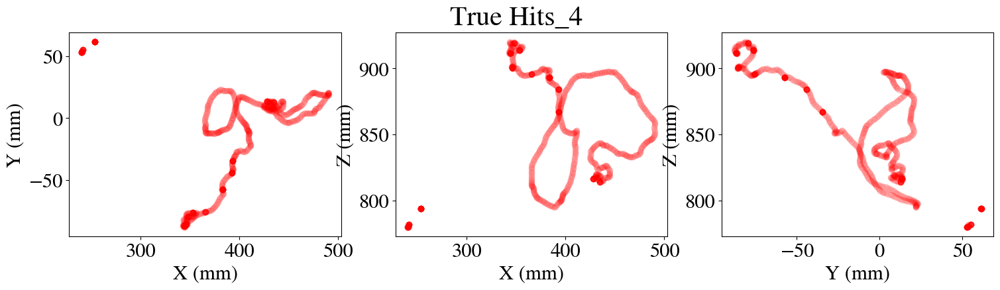

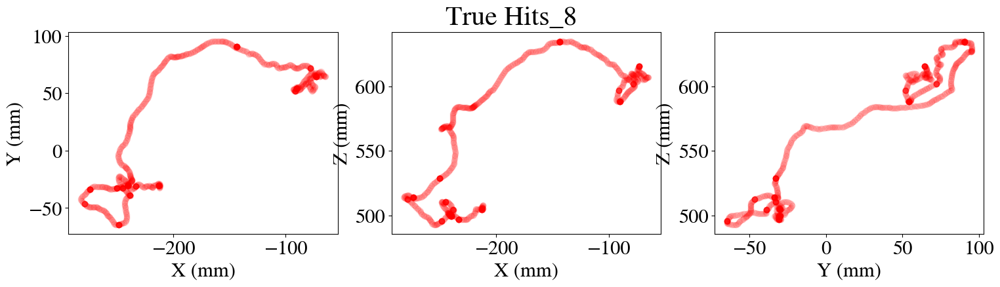

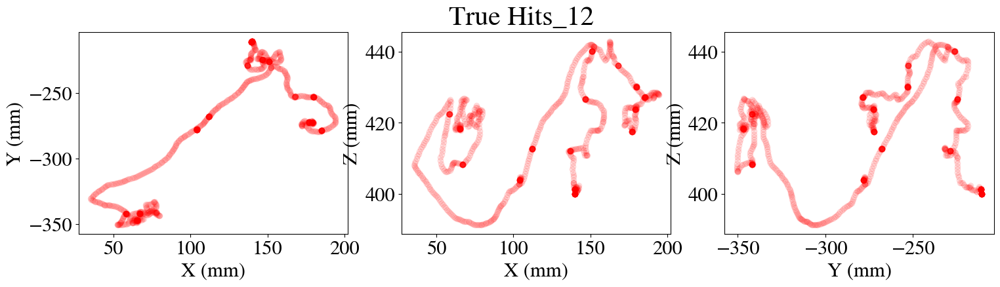

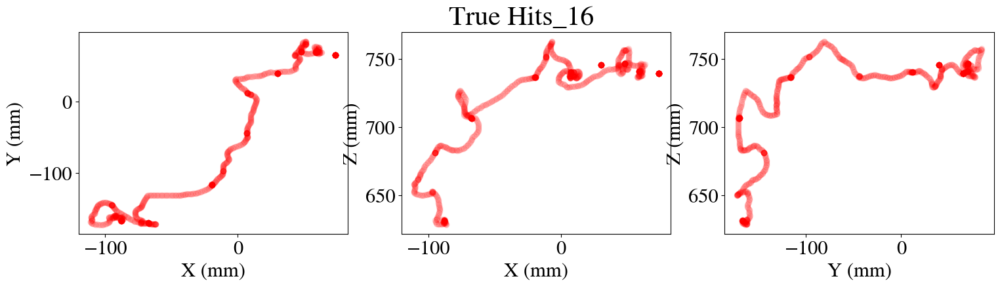

...

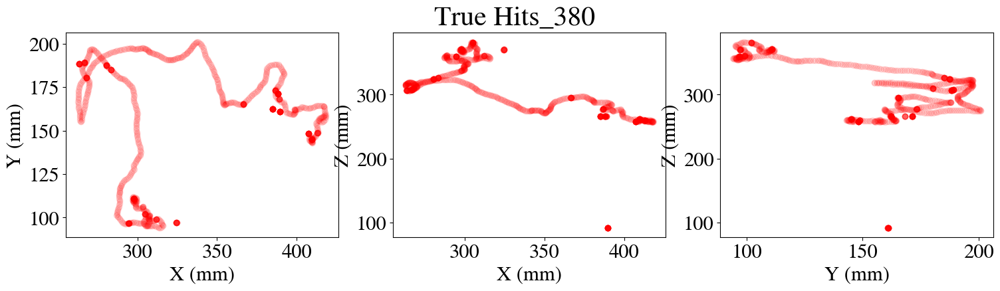

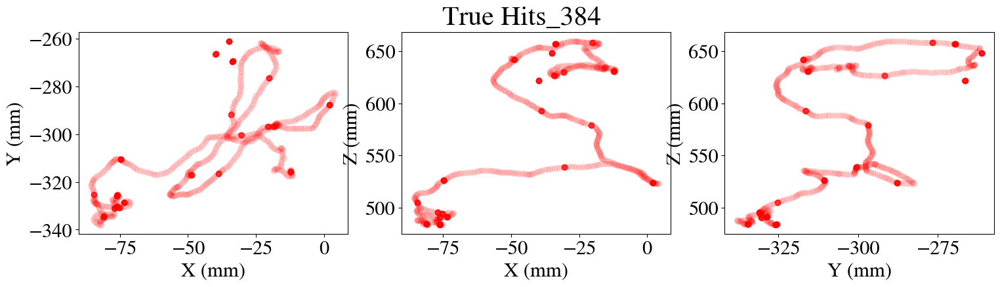

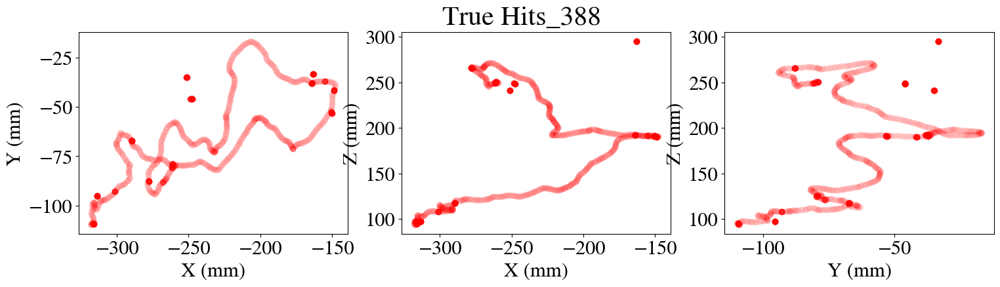

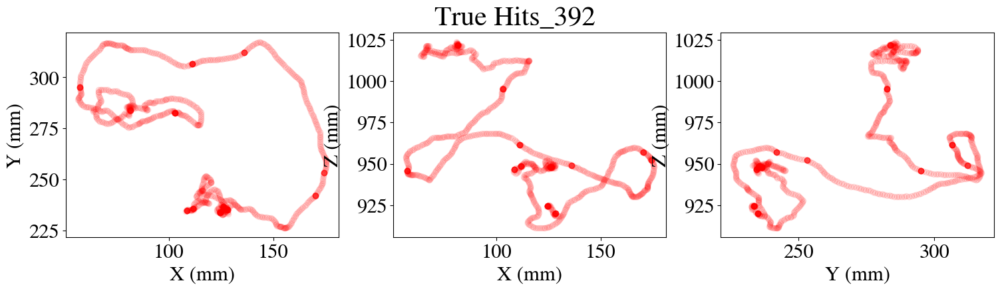

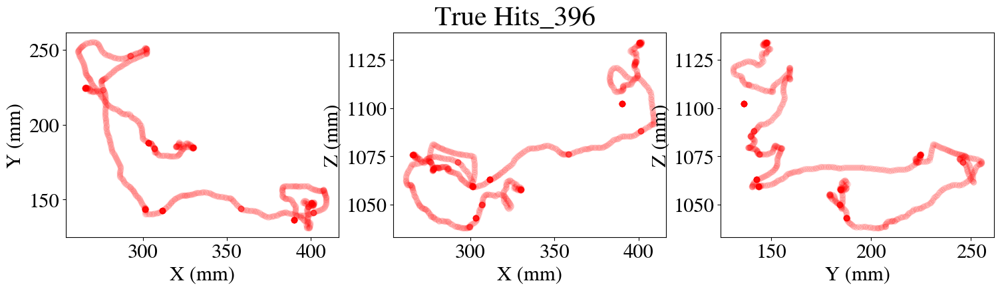

In [42]:
# print this number of events
event_no = 100

# MC true hits plotted.
for i in event_list[:event_no]:

    print("({}/{})".format(i, len(event_list[:event_no])))


    evtmap = mcio.load_eventnumbermap(directory + soph_array[0]).set_index('nexus_evt')
    true_info = mcio.load_mchits_df(directory + soph_array[0]).reset_index()
    true_info.event_id = true_info.event_id.map(evtmap.evt_number)
    
    
    this_evt_true_info = true_info[true_info.event_id == event_list[i]]

    xt = this_evt_true_info.x
    yt = this_evt_true_info.y
    zt = this_evt_true_info.z
    et = this_evt_true_info.energy*1000

    fig, axes = plt.subplots(1, 3, figsize=(18, 4))
    axes[0].scatter(xt, yt,  alpha=0.1, color='red')
    axes[0].set_xlabel('X (mm)');
    axes[0].set_ylabel('Y (mm)');

    axes[1].scatter(xt, zt,  alpha=0.1, color='red')
    axes[1].set_xlabel('X (mm)');
    axes[1].set_ylabel('Z (mm)');

    axes[2].scatter(yt, zt,  alpha=0.1, color='red')
    axes[2].set_xlabel('Y (mm)');
    axes[2].set_ylabel('Z (mm)');
    
    fig.suptitle('True Hits_' + str(event_list[i]), fontsize=30)
    fig.savefig(str(pre_dir_name) + "MC_hits/" + "MC_hits_" + str(event_list[i]))

### PLOT SOPHRONIA OUTPUT ACROSS THESE FILES

First (due to the refactoring) we need to convert these to low threshold events

In [43]:
print("mu1")
lowTh_QTHR1 = soph_to_lowTh(mu1, threshold= 3, verbose = False)
print("mu2")
lowTh_QTHR3 = soph_to_lowTh(mu2, threshold= 3, verbose = False)
print("mu3")
lowTh_QTHR5 = soph_to_lowTh(mu3, threshold= 3, verbose = False)

mu1
mu2
mu3


In [55]:
def create_plot(file, event_number, pitch = 15.55, set_bins = False, xx = 0, yy = 0, zz = 0, title = "", savearg = ""):
    '''
    create sophronia plot from the file and event number provided
    needs to be lowTh file :)
    '''
    # collect the specific event
    hits = file[file['event'] == event_number]
    print("Event {}".format(event_number))


    # print
    fig, axes = plt.subplots(1, 3, figsize=(18, 4))

    if (set_bins == False):
        xx = np.arange(hits.X.min(), hits.X.max() + pitch, pitch)
        yy = np.arange(hits.Y.min(), hits.Y.max() + pitch, pitch)
        zz = hits.Z.unique()

    axes[0].hist2d(hits.X, hits.Y, bins=[xx, yy], weights=hits.Q, cmin=0.0001);
    axes[0].set_xlabel('X (mm)');
    axes[0].set_ylabel('Y (mm)');

    axes[1].hist2d(hits.X, hits.Z, bins=[xx, zz], weights=hits.Q, cmin=0.0001);
    axes[1].set_xlabel('X (mm)');
    axes[1].set_ylabel('Z (mm)');


    axes[2].hist2d(hits.Y, hits.Z, bins=[yy, zz], weights=hits.Q, cmin=0.0001);
    axes[2].set_xlabel('Y (mm)');
    axes[2].set_ylabel('Z (mm)');

    if (title == ""):
        fig.suptitle('Sensors Signal_' + str(event_number), fontsize=30)
    else:
        fig.suptitle('Sensors Signal_' + str(event_number) + " " + str(title), fontsize=30)

    if (savearg == ""):
        fig.savefig(str(pre_dir_name) + "sensor_signal/" + "sensor_signal" + str(event_number))
    else:
        fig.savefig(str(pre_dir_name) + "sensor_signal/" + "sensor_signal" + str(event_number) + "_" + str(savearg))
    plt.show()

    # then z slice sipms
    soph_evt = file[file.event == event_number]
    z_slice = soph_evt.groupby(['Z']).apply(lambda x: len(x))#E.nunique()

    plt.bar(z_slice.index, z_slice.values)
    if (title == ""):
        plt.title("event " + str(event_number))
    else:
        plt.title("event " + str(event_number) + " " + str(title))
    plt.xlabel("Z")
    plt.ylabel("SiPM hits")
    
    plt.show()



def sipm_hit_plot(file_1, file_2, file_3, label_1, label_2, label_3, event_number):

    # then z slice sipms
    soph_evt = file_1[file_1.event == event_number]
    z_slice = soph_evt.groupby(['Z']).apply(lambda x: len(x))#E.nunique()

    plt.bar(z_slice.index, z_slice.values, label = label_1)


    # then z slice sipms
    soph_evt = file_2[file_2.event == event_number]
    z_slice = soph_evt.groupby(['Z']).apply(lambda x: len(x))#E.nunique()

    plt.bar(z_slice.index, z_slice.values, label = label_2)


    # then z slice sipms
    soph_evt = file_3[file_3.event == event_number]
    z_slice = soph_evt.groupby(['Z']).apply(lambda x: len(x))#E.nunique()

    plt.bar(z_slice.index, z_slice.values, label = label_3)


    plt.title("event " + str(event_number))
    plt.xlabel("Z")
    plt.legend()
    plt.ylabel("SiPM hits")
    fig.savefig(str(pre_dir_name) + "z_slices/" + "z_slice_" + str(event_number))
    #plt.show()



BACKGROUND
Event 0


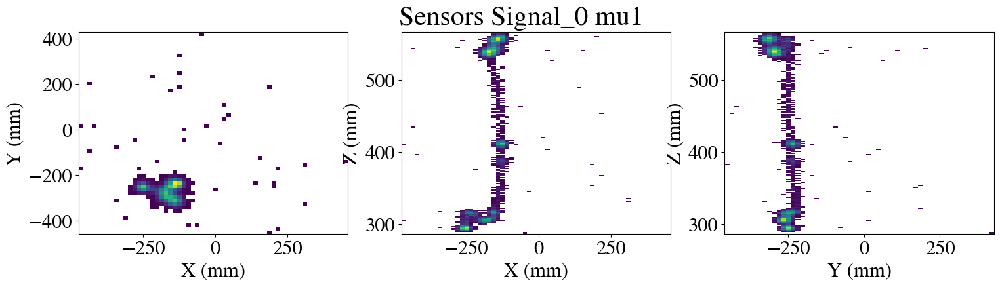

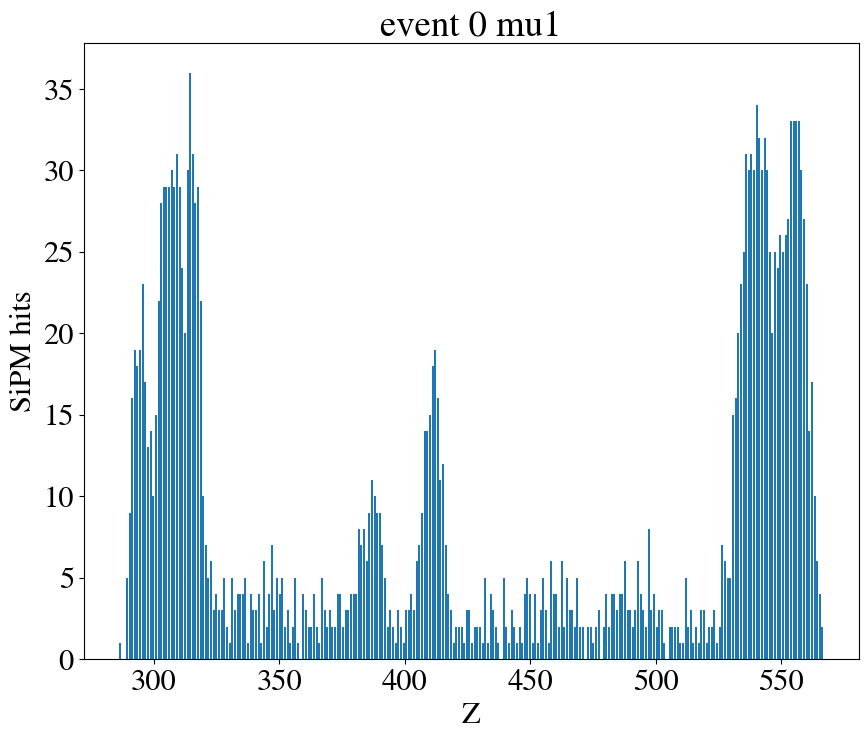

Event 0


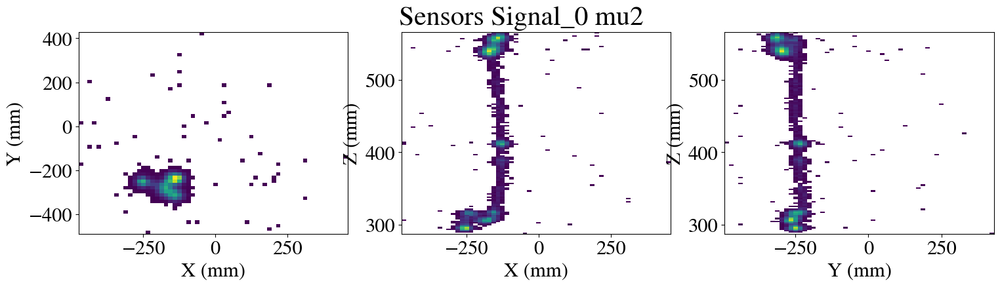

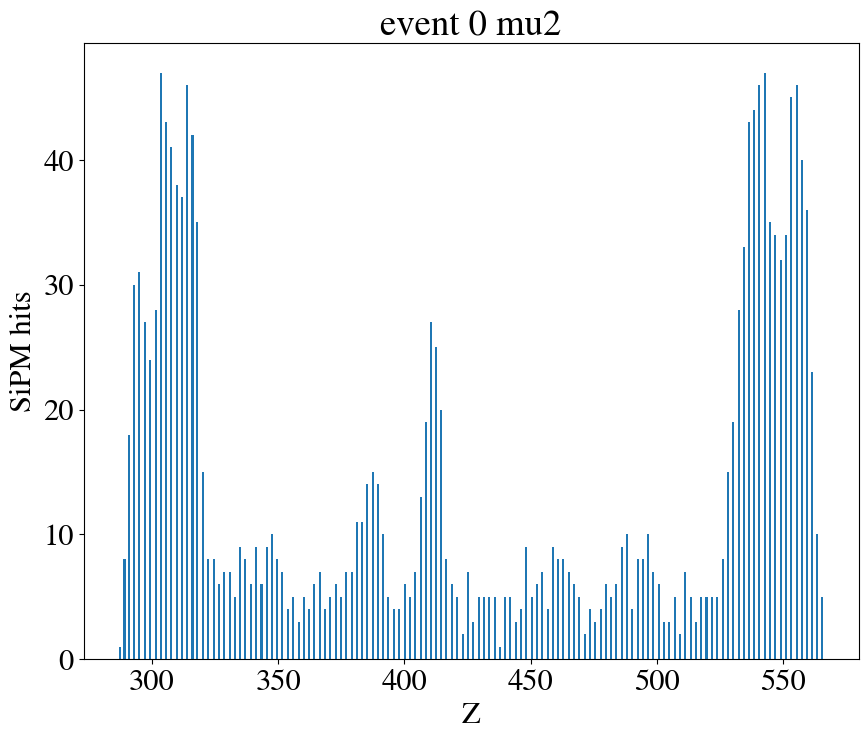

Event 0


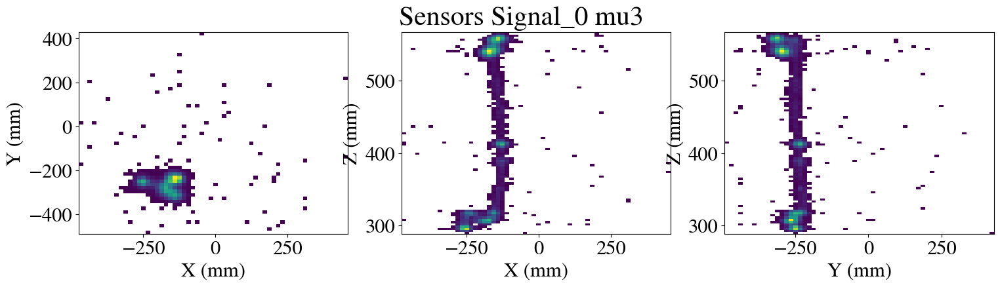

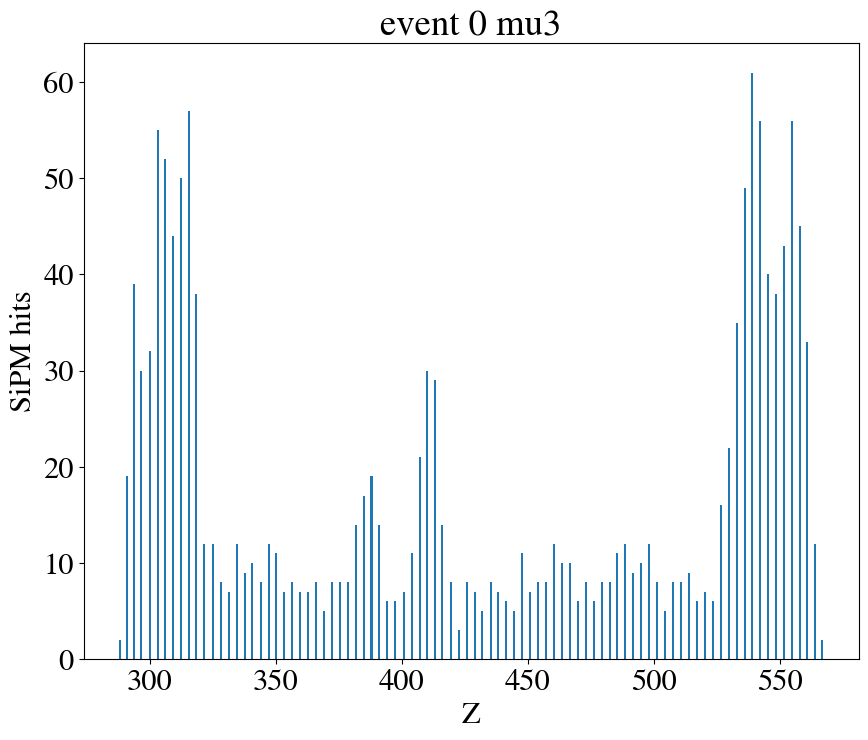

'\n# then z slice sipms\nsoph_evt = lowTh_QTHR1[lowTh_QTHR1.event == bck_array[0]]\nz_slice = soph_evt.groupby([\'Z\']).apply(lambda x: len(x))#E.nunique()\n\nplt.bar(z_slice.index, z_slice.values, label = \'QTHR_1\')\n\n\n# then z slice sipms\nsoph_evt = lowTh_QTHR3[lowTh_QTHR3.event == bck_array[0]]\nz_slice = soph_evt.groupby([\'Z\']).apply(lambda x: len(x))#E.nunique()\n\nplt.bar(z_slice.index, z_slice.values, label = \'QTHR_3\')\n\n\n# then z slice sipms\nsoph_evt = lowTh_QTHR5[lowTh_QTHR5.event == bck_array[0]]\nz_slice = soph_evt.groupby([\'Z\']).apply(lambda x: len(x))#E.nunique()\n\nplt.bar(z_slice.index, z_slice.values, label = \'QTHR_5\')\n\n\nplt.title("event " + str(bck_array[0]))\nplt.xlabel("Z")\nplt.legend()\nplt.ylabel("SiPM hits")\n#plt.show()\n'

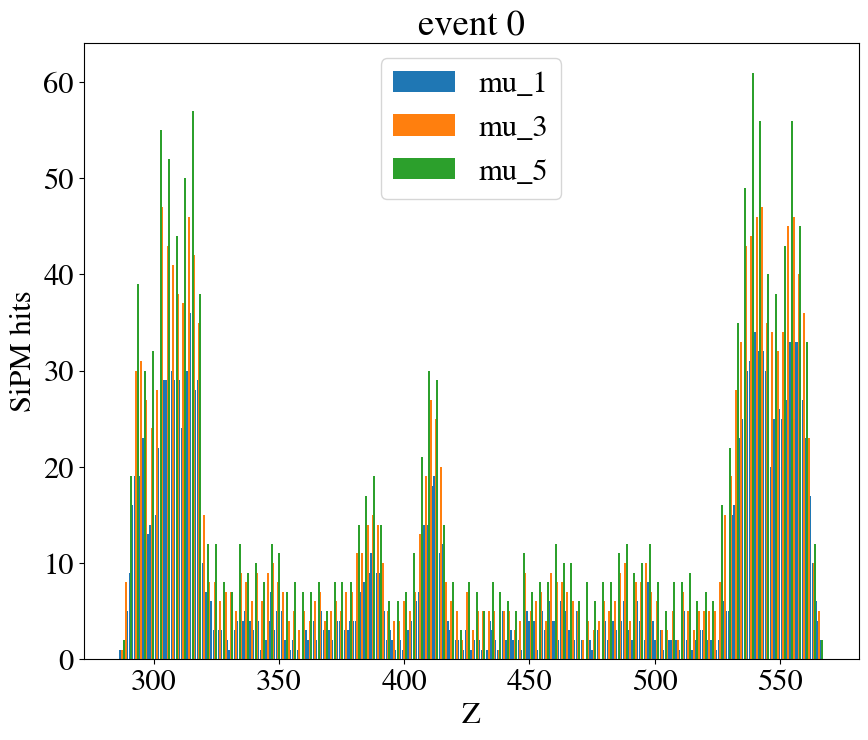

In [56]:
# generating the most generic xyz coords
print("BACKGROUND")
pitch = 15.55

label = ['mu1', 'mu2', 'mu3']
lowTh_array = [lowTh_QTHR1, lowTh_QTHR3, lowTh_QTHR5]
hits.append(lowTh_QTHR1[lowTh_QTHR1['event'] == event_list[0]])

for i in range(len(lowTh_array)):
    hits = (lowTh_array[i])[(lowTh_array[i])['event'] == event_list[0]]
    xx = np.arange(hits.X.min(), hits.X.max() + pitch, pitch)
    yy = np.arange(hits.Y.min(), hits.Y.max() + pitch, pitch)
    zz = hits.Z.unique()
    create_plot(lowTh_array[i], event_list[0], set_bins = True, xx = xx, yy = yy, zz = zz, title = label[i], savearg = str(label[i]))


sipm_hit_plot(lowTh_QTHR1, lowTh_QTHR3, lowTh_QTHR5, 'mu_1', 'mu_3', 'mu_5', event_list[0])

'''
create_plot(lowTh_QTHR1, event_list[0], set_bins = True, xx = xx, yy = yy, zz = zz)

create_plot(lowTh_QTHR3, event_list[0], set_bins = True, xx = xx, yy = yy, zz = zz)

create_plot(lowTh_QTHR5, event_list[0], set_bins = True, xx = xx, yy = yy, zz = zz)

sipm_hit_plot(lowTh_QTHR1, lowTh_QTHR3, lowTh_QTHR5, 'QTHR_1', 'QTHR_3', 'QTHR_5', event_list[0])
'''

'''
# then z slice sipms
soph_evt = lowTh_QTHR1[lowTh_QTHR1.event == bck_array[0]]
z_slice = soph_evt.groupby(['Z']).apply(lambda x: len(x))#E.nunique()

plt.bar(z_slice.index, z_slice.values, label = 'QTHR_1')


# then z slice sipms
soph_evt = lowTh_QTHR3[lowTh_QTHR3.event == bck_array[0]]
z_slice = soph_evt.groupby(['Z']).apply(lambda x: len(x))#E.nunique()

plt.bar(z_slice.index, z_slice.values, label = 'QTHR_3')


# then z slice sipms
soph_evt = lowTh_QTHR5[lowTh_QTHR5.event == bck_array[0]]
z_slice = soph_evt.groupby(['Z']).apply(lambda x: len(x))#E.nunique()

plt.bar(z_slice.index, z_slice.values, label = 'QTHR_5')


plt.title("event " + str(bck_array[0]))
plt.xlabel("Z")
plt.legend()
plt.ylabel("SiPM hits")
#plt.show()
'''


### create a loop for the above that sends them to folders

In [57]:
label = ['mu1', 'mu2', 'mu3']
lowTh_array = [lowTh_QTHR1, lowTh_QTHR3, lowTh_QTHR5]

for i in event_list[:event_no]:
    pitch = 15.55


    hits.append(lowTh_QTHR1[lowTh_QTHR1['event'] == event_list[i]])

    for j in range(len(lowTh_array)):
        hits = (lowTh_array[j])[(lowTh_array[j])['event'] == event_list[i]]
        xx = np.arange(hits.X.min(), hits.X.max() + pitch, pitch)
        yy = np.arange(hits.Y.min(), hits.Y.max() + pitch, pitch)
        zz = hits.Z.unique()
        create_plot(lowTh_array[j], event_list[i], set_bins = True, xx = xx, yy = yy, zz = zz, title = label[j], savearg = str(label[j]))


    sipm_hit_plot(lowTh_QTHR1, lowTh_QTHR3, lowTh_QTHR5, 'mu_1', 'mu_3', 'mu_5', event_list[i])


SyntaxError: invalid syntax (2018627355.py, line 4)

SIGNAL
Event 2140060


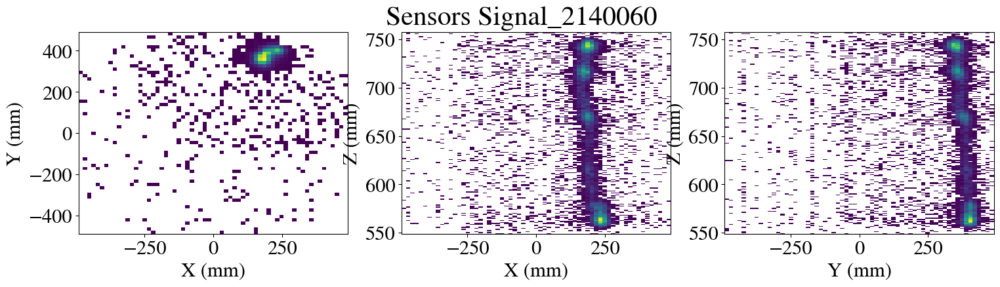

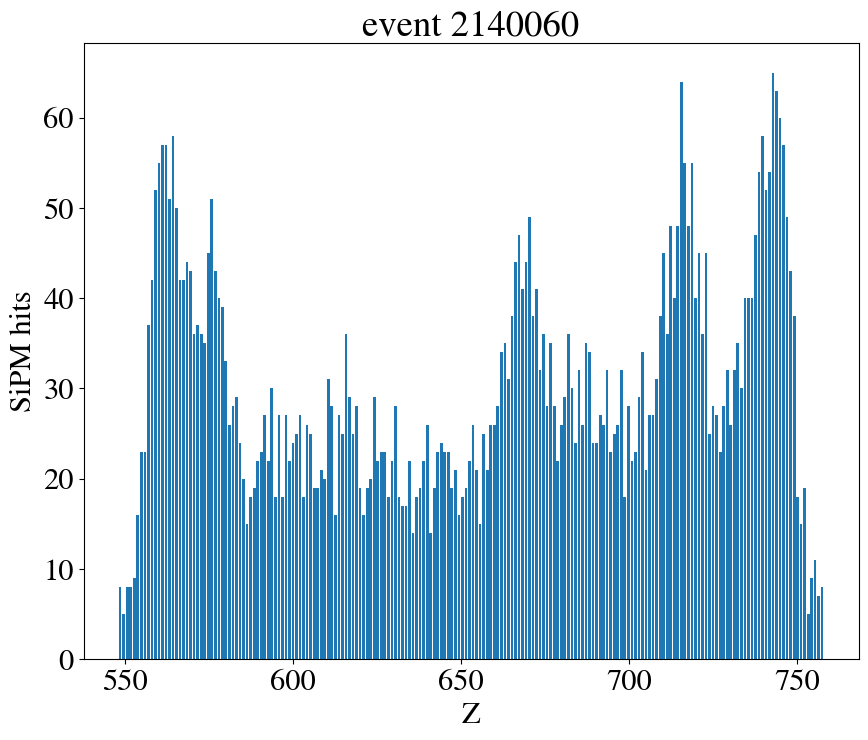

Event 2140060


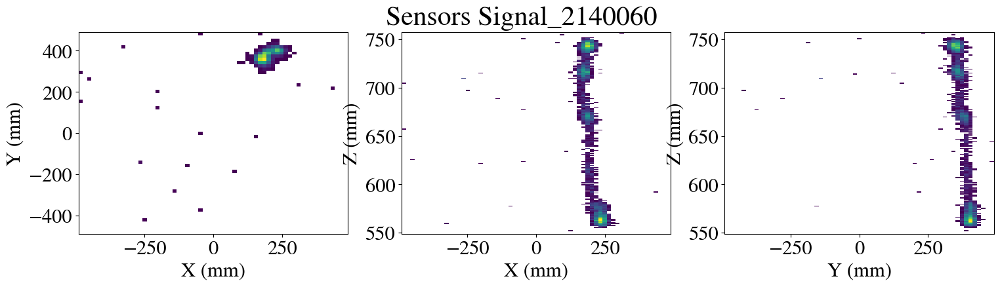

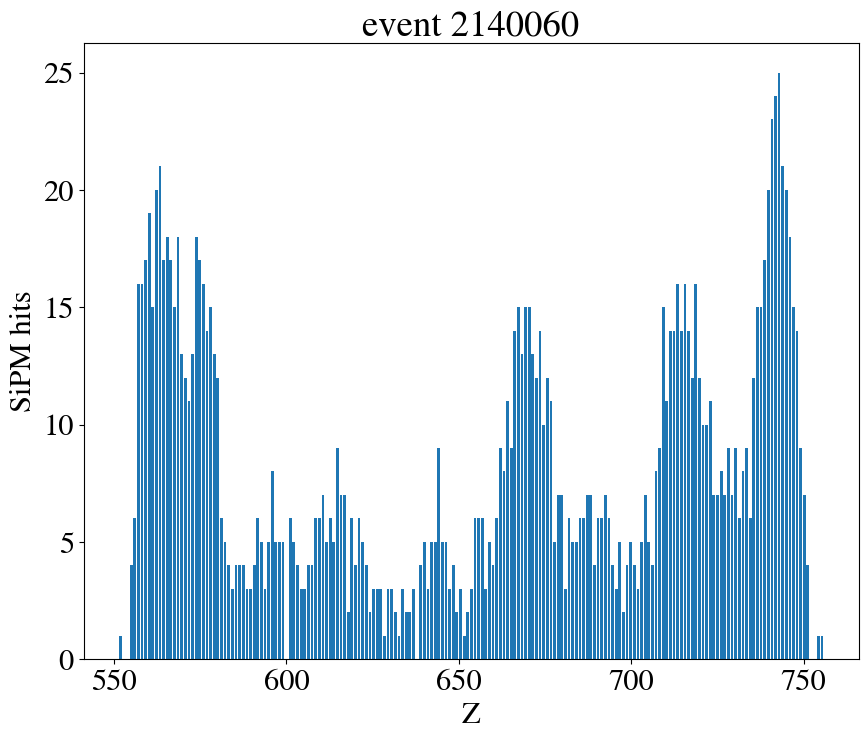

Event 2140060


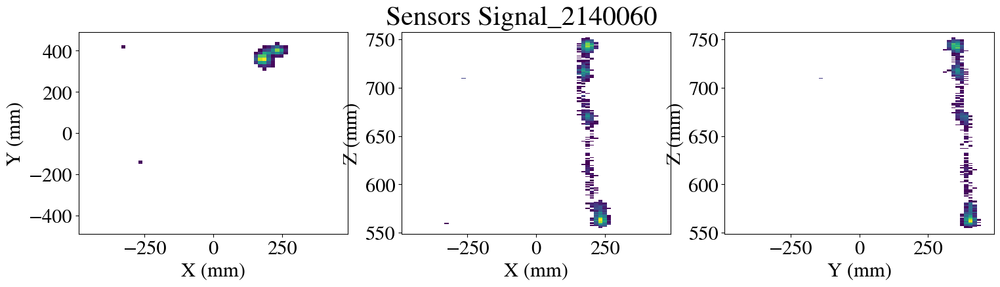

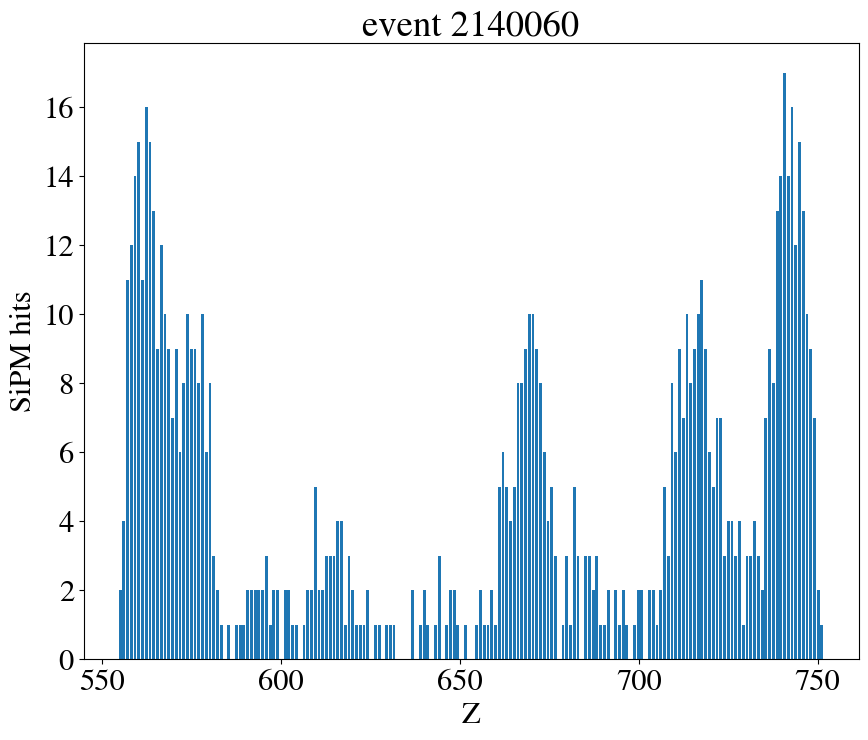

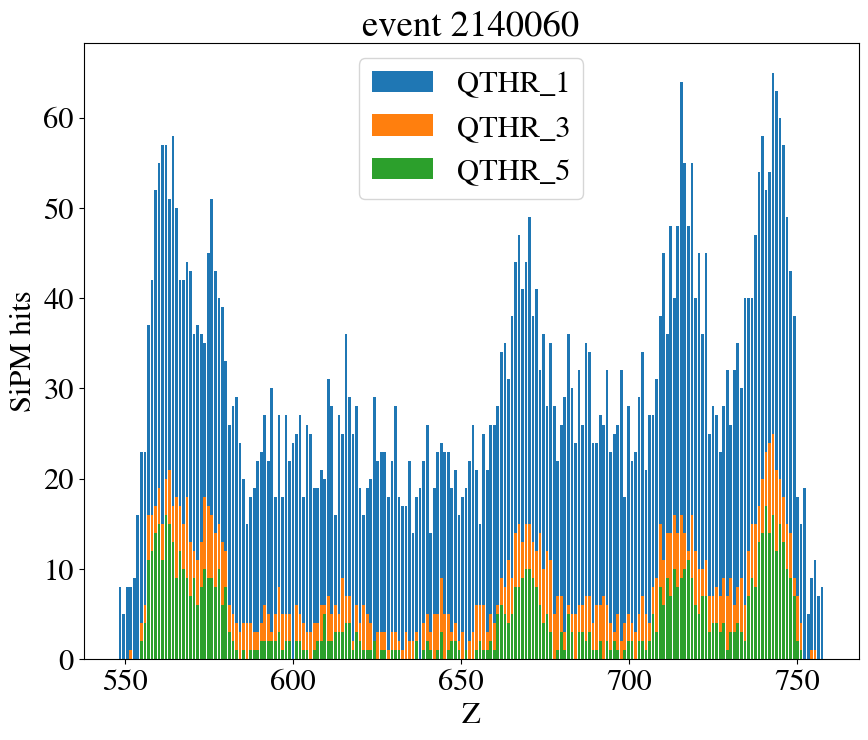

In [57]:
print("SIGNAL")
# generating the most generic xyz coords
pitch = 15.55
hits = lowTh_QTHR1[lowTh_QTHR1['event'] == sig_array[0]]
xx = np.arange(hits.X.min(), hits.X.max() + pitch, pitch)
yy = np.arange(hits.Y.min(), hits.Y.max() + pitch, pitch)
zz = hits.Z.unique()

create_plot(lowTh_QTHR1, sig_array[0], set_bins = True, xx = xx, yy = yy, zz = zz)
create_plot(lowTh_QTHR3, sig_array[0], set_bins = True, xx = xx, yy = yy, zz = zz)
create_plot(lowTh_QTHR5, sig_array[0], set_bins = True, xx = xx, yy = yy, zz = zz)

sipm_hit_plot(lowTh_QTHR1, lowTh_QTHR3, lowTh_QTHR5, 'QTHR_1', 'QTHR_3', 'QTHR_5', sig_array[0])


SIGNAL
Event 2140138


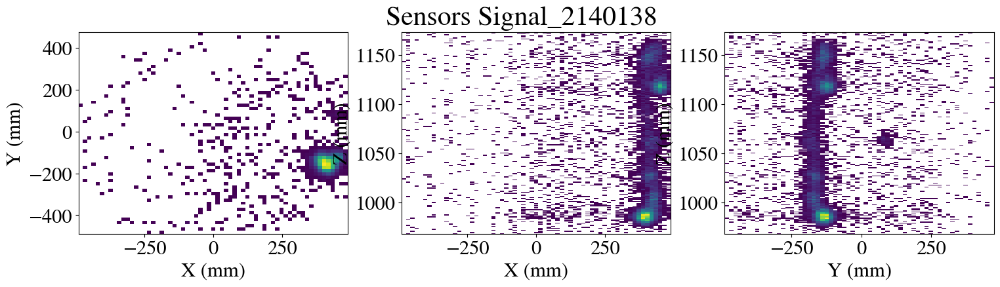

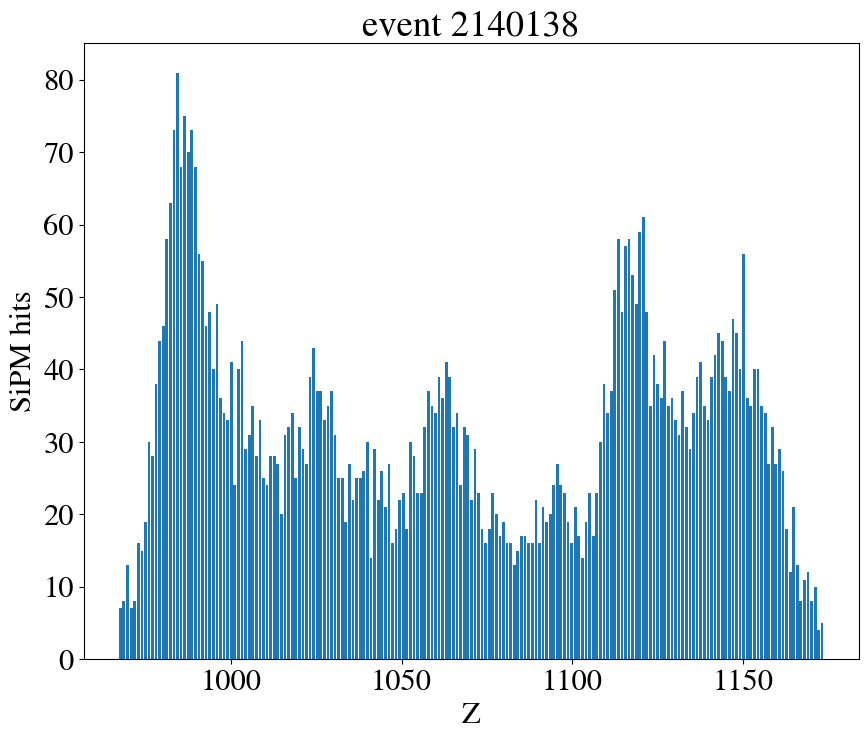

Event 2140138


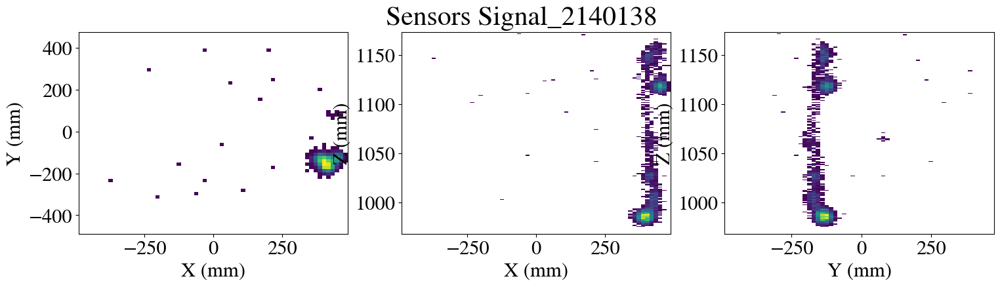

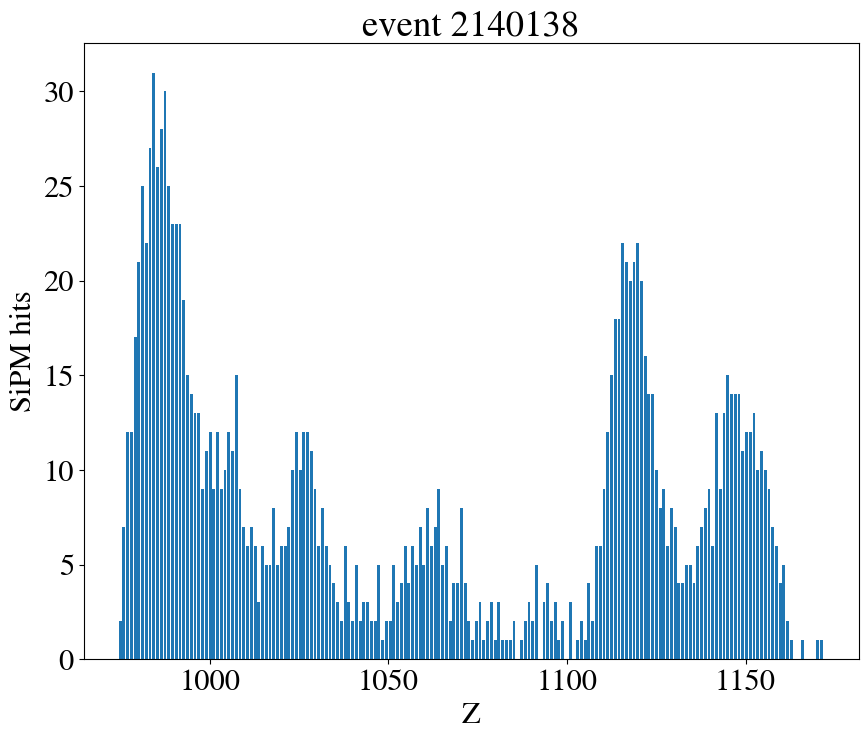

Event 2140138


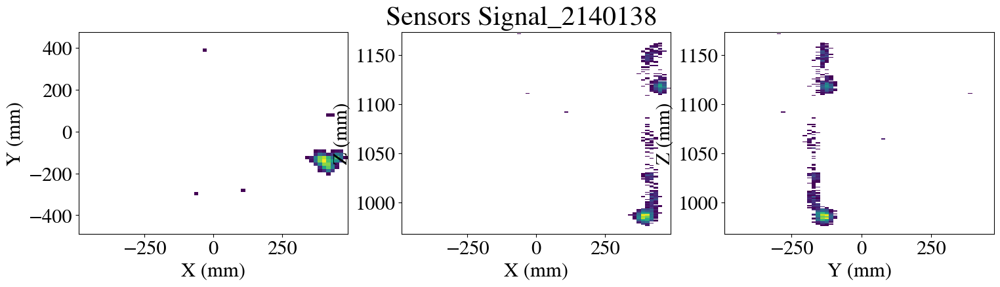

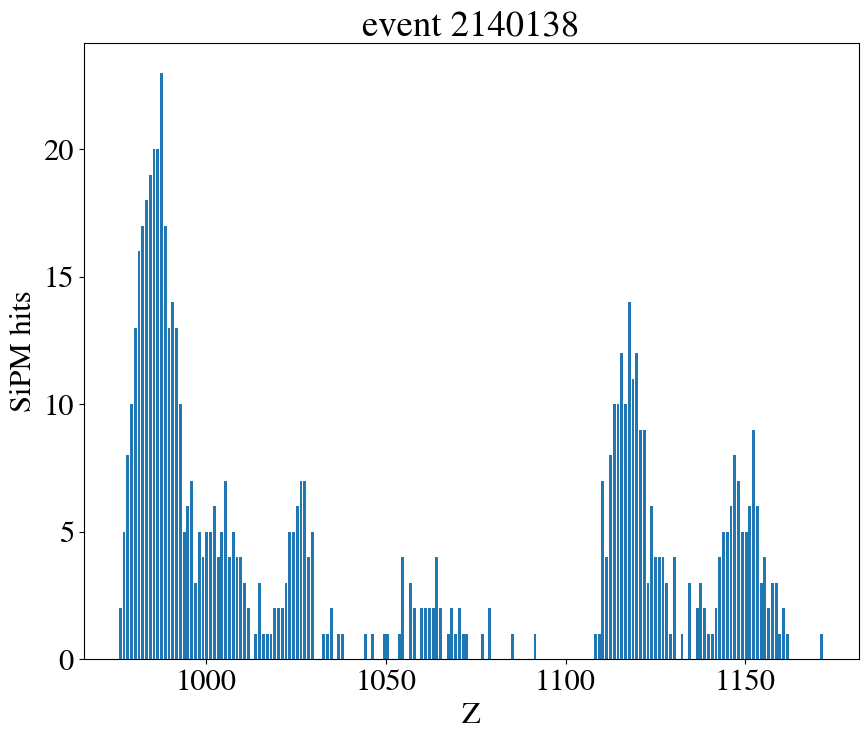

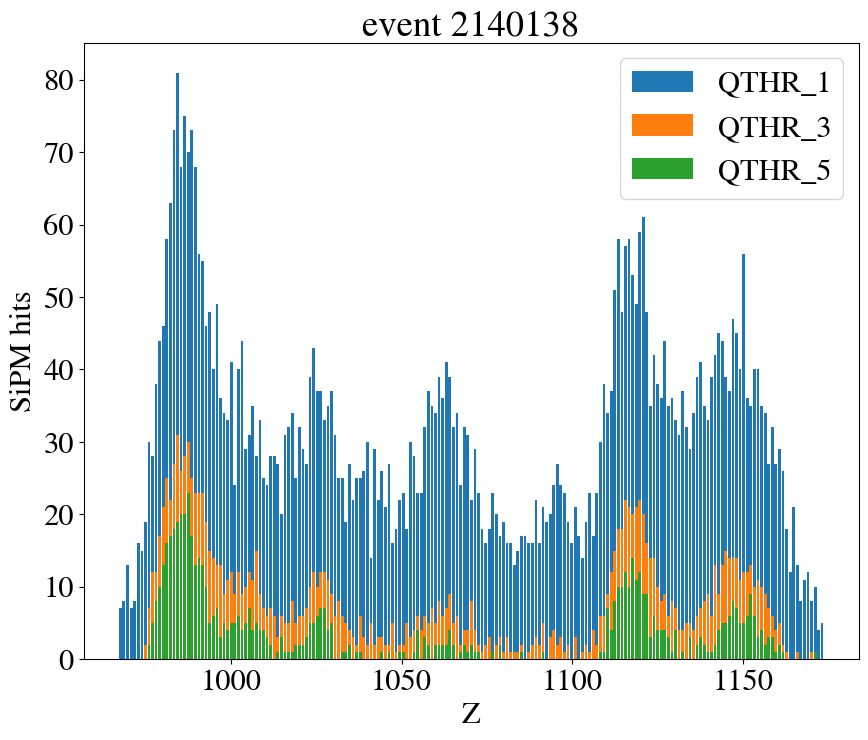

In [58]:
print("SIGNAL")
# generating the most generic xyz coords
pitch = 15.55
hits = lowTh_QTHR1[lowTh_QTHR1['event'] == sig_array[2]]
xx = np.arange(hits.X.min(), hits.X.max() + pitch, pitch)
yy = np.arange(hits.Y.min(), hits.Y.max() + pitch, pitch)
zz = hits.Z.unique()

create_plot(lowTh_QTHR1, sig_array[2], set_bins = True, xx = xx, yy = yy, zz = zz)
create_plot(lowTh_QTHR3, sig_array[2], set_bins = True, xx = xx, yy = yy, zz = zz)
create_plot(lowTh_QTHR5, sig_array[2], set_bins = True, xx = xx, yy = yy, zz = zz)

sipm_hit_plot(lowTh_QTHR1, lowTh_QTHR3, lowTh_QTHR5, 'QTHR_1', 'QTHR_3', 'QTHR_5', sig_array[2])


### load in the rebinned data

In [36]:
# load the data
directory_us = f'../../next_misc/Tl_studies/sophronia_2us/'
# qthr is kept at 3 here
rebin1 = dstio.load_dst(directory + soph_array[1], 'RECO', 'Events')
rebin2 = dstio.load_dst(directory_us + 'sophronia_qthr3_2us.h5', 'RECO', 'Events')
rebin3 = dstio.load_dst(directory_us + 'sophronia_qthr3_3us.h5', 'RECO', 'Events')

In [37]:
print("rebin1")
lowTh_rebin1 = soph_to_lowTh(rebin1, threshold= 3, verbose = False)
print("rebin2")
lowTh_rebin2 = soph_to_lowTh(rebin2, threshold= 3, verbose = False)
print("rebin3")
lowTh_rebin3 = soph_to_lowTh(rebin3, threshold= 3, verbose = False)

rebin1
rebin2
rebin3


### now plot it

BACKGROUND
Event 2140000


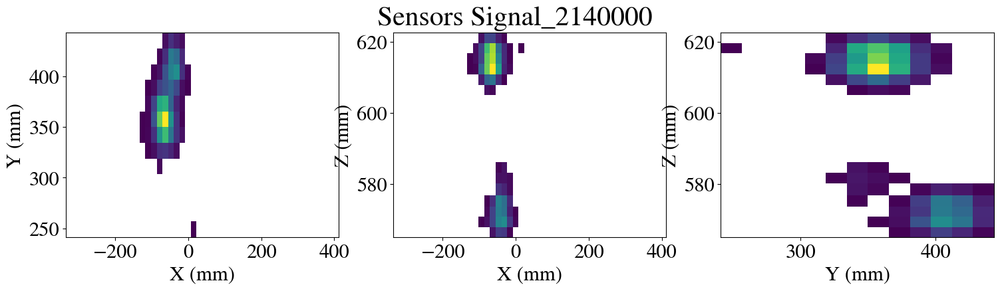

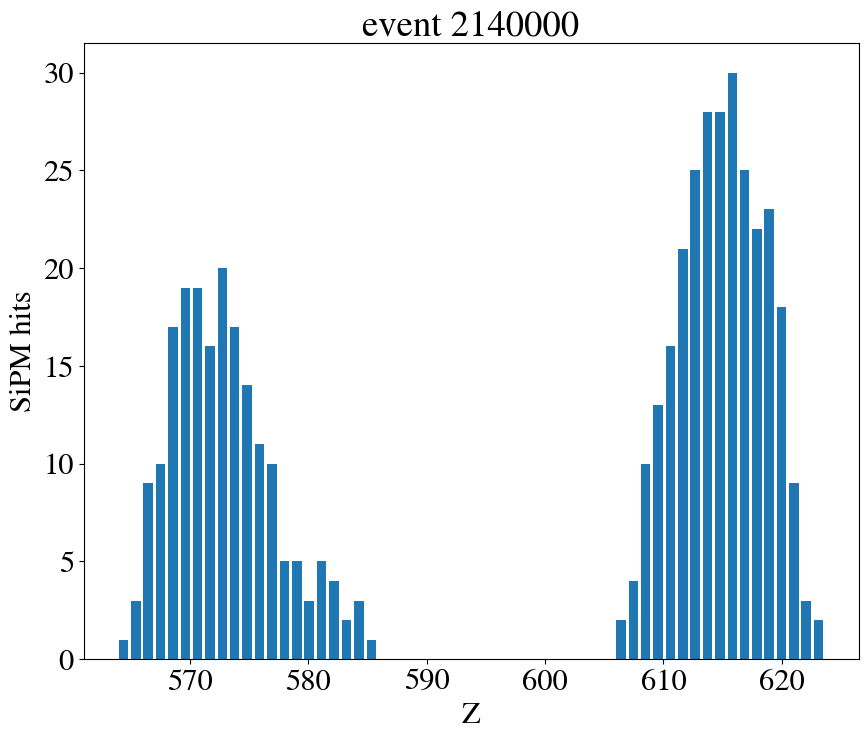

Event 2140000


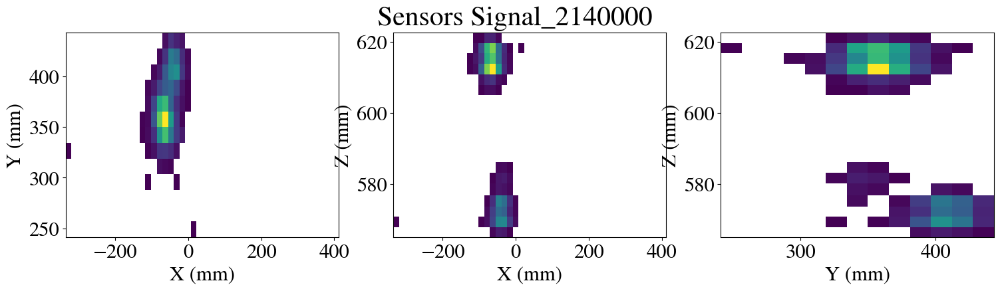

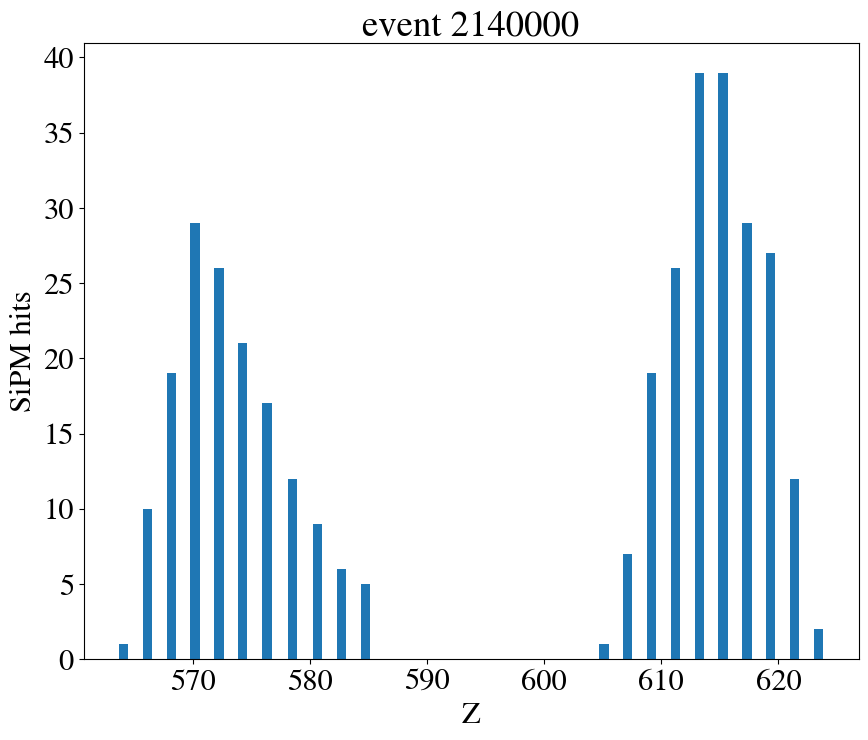

Event 2140000


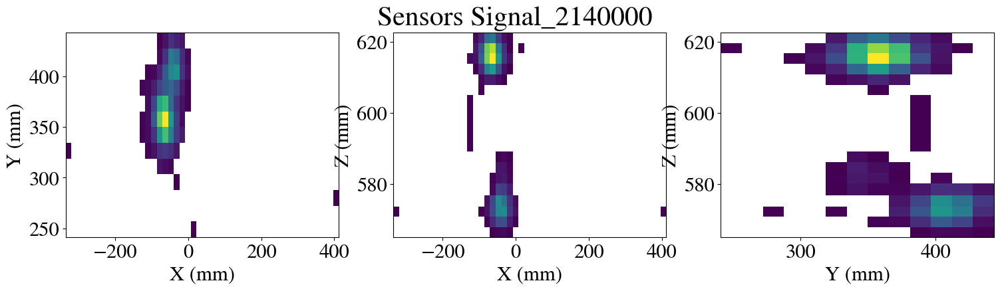

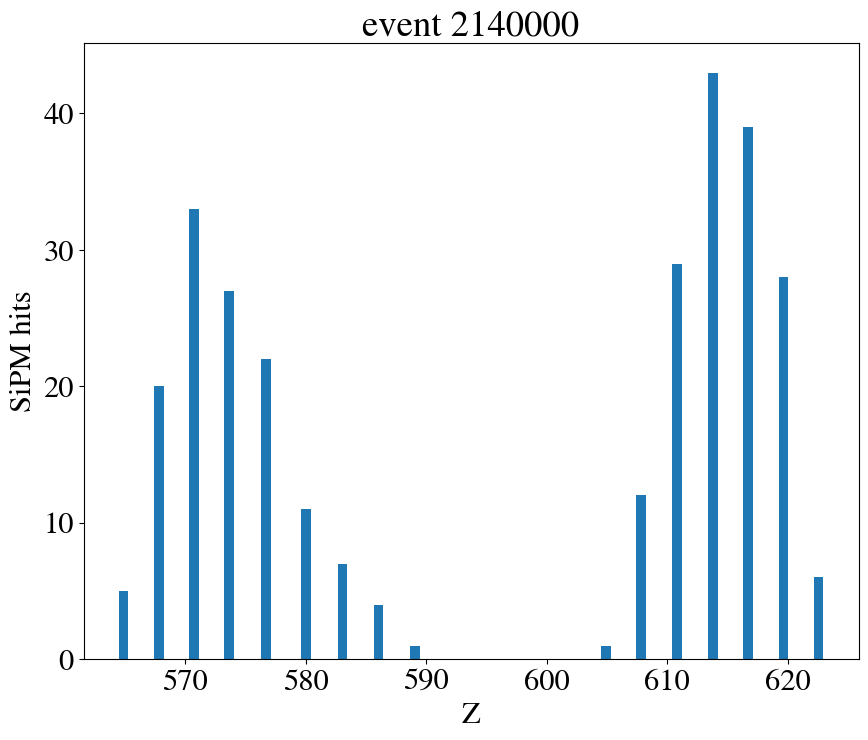

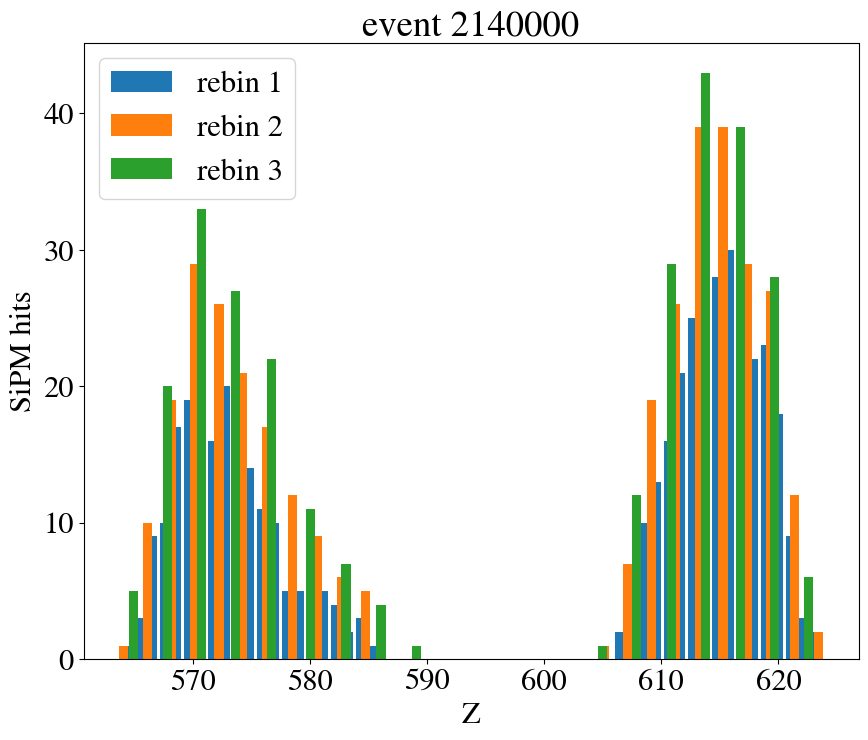

In [61]:
# generating the most generic xyz coords
print("BACKGROUND")
pitch = 15.55
hits = lowTh_rebin3[lowTh_rebin3['event'] == bck_array[0]]
xx = np.arange(hits.X.min(), hits.X.max() + pitch, pitch)
yy = np.arange(hits.Y.min(), hits.Y.max() + pitch, pitch)
zz = hits.Z.unique()

create_plot(lowTh_rebin1, bck_array[0], set_bins = True, xx = xx, yy = yy, zz = zz)
create_plot(lowTh_rebin2, bck_array[0], set_bins = True, xx = xx, yy = yy, zz = zz)
create_plot(lowTh_rebin3, bck_array[0], set_bins = True, xx = xx, yy = yy, zz = zz)

sipm_hit_plot(lowTh_rebin1, lowTh_rebin2, lowTh_rebin3, 'rebin 1', 'rebin 2', 'rebin 3', bck_array[0])



BACKGROUND
Event 2140006


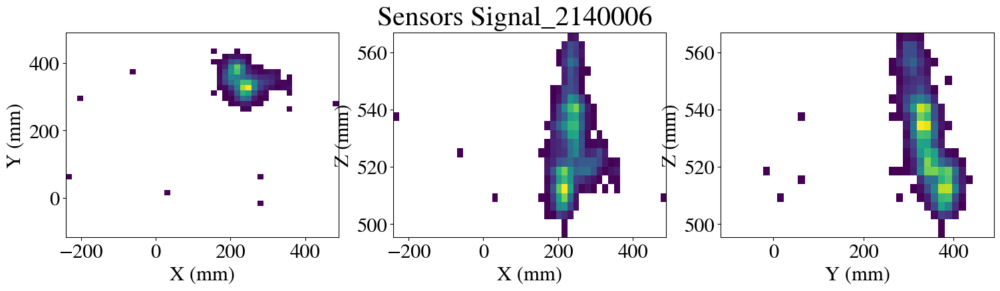

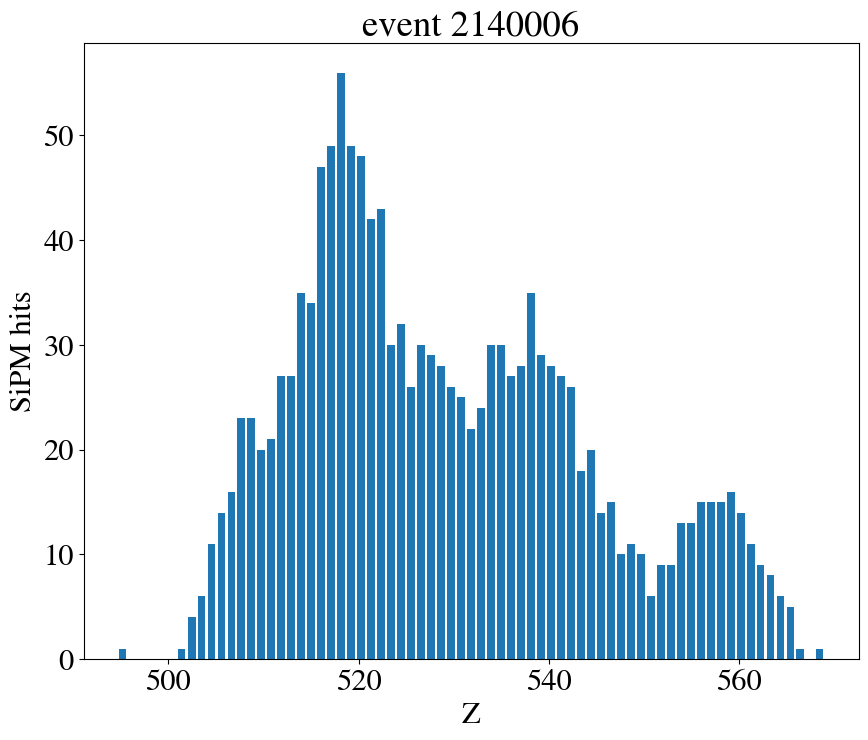

Event 2140006


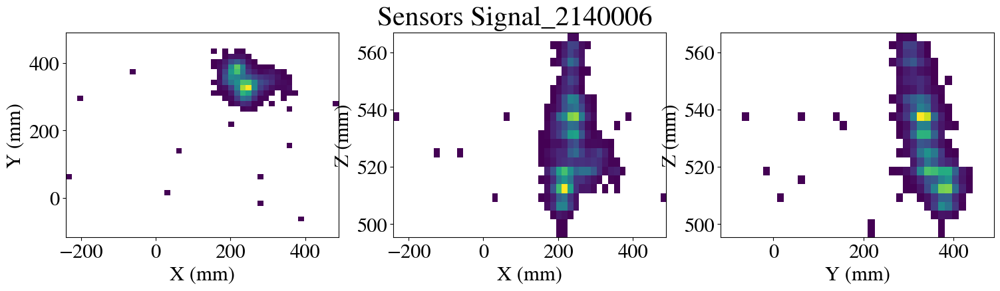

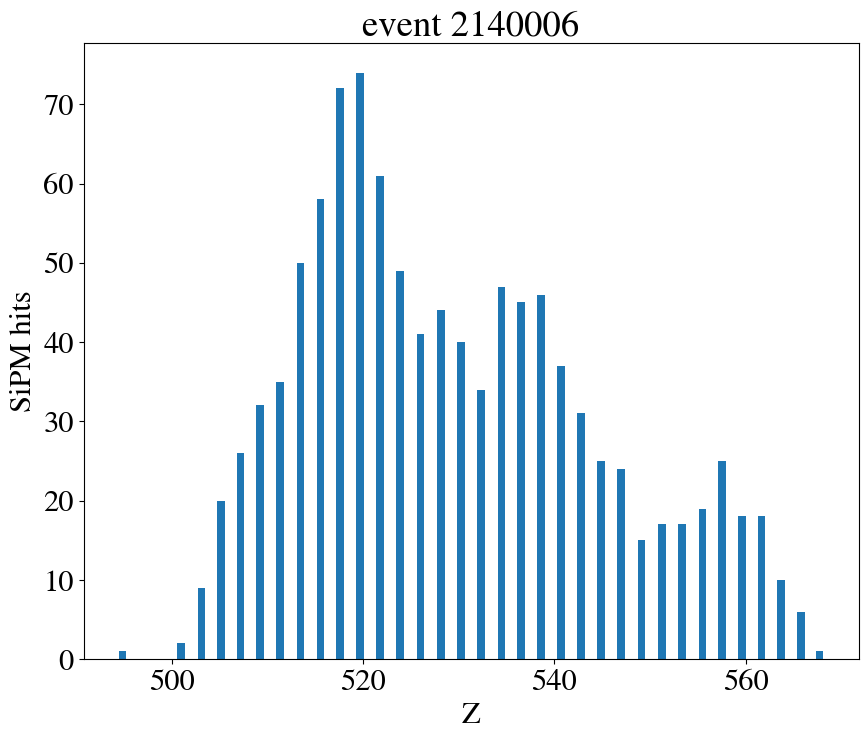

Event 2140006


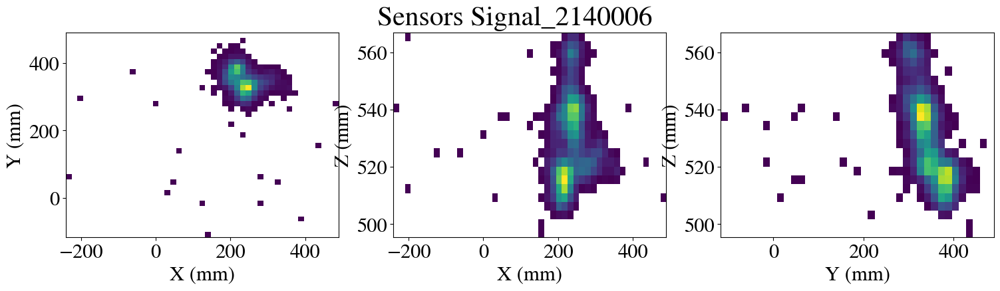

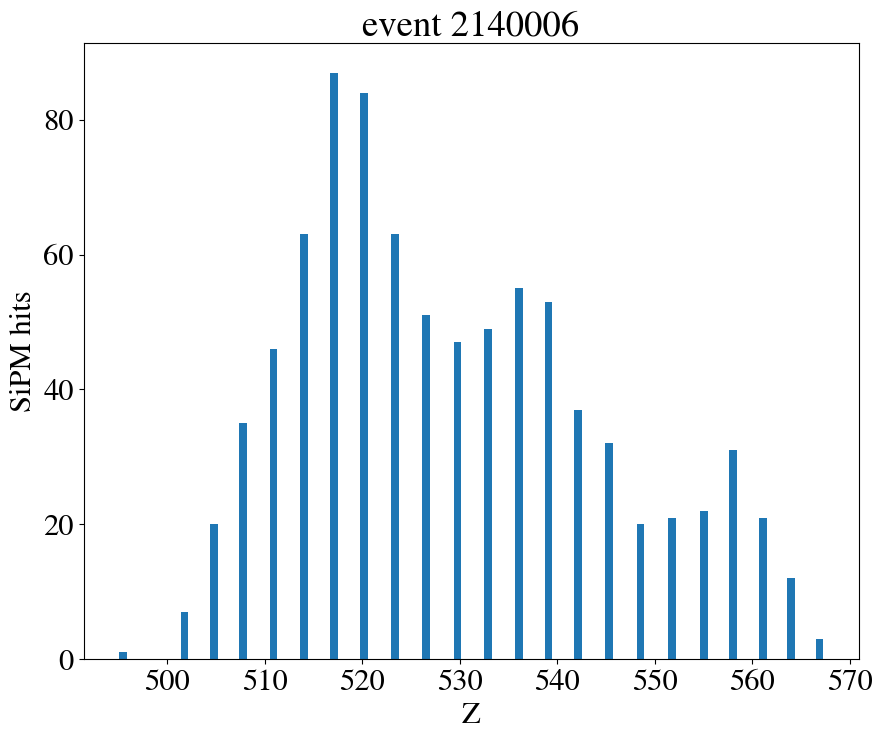

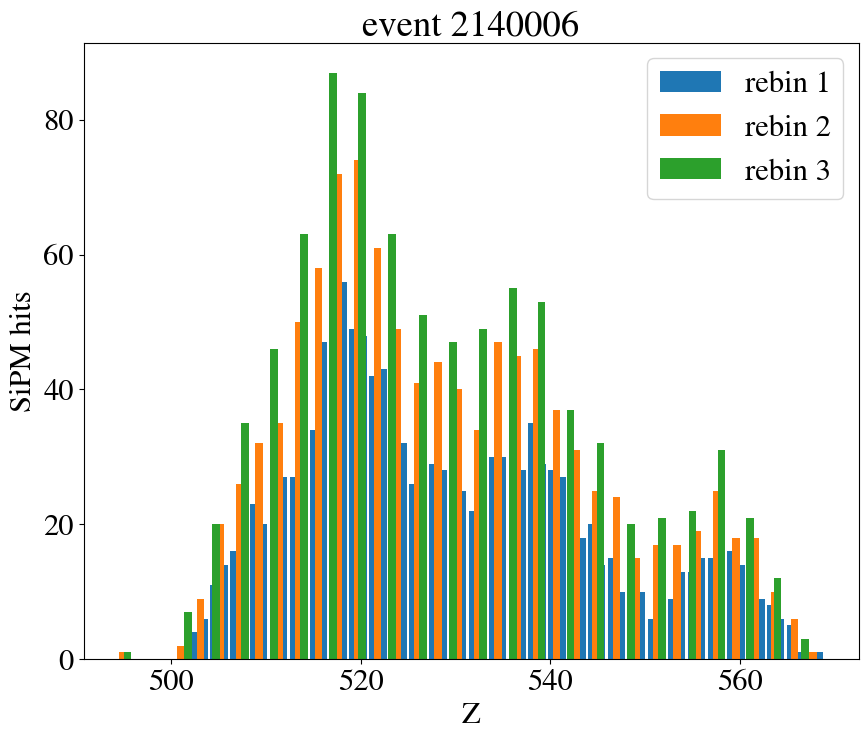

In [62]:
# generating the most generic xyz coords
print("BACKGROUND")
pitch = 15.55
hits = lowTh_rebin3[lowTh_rebin3['event'] == bck_array[2]]
xx = np.arange(hits.X.min(), hits.X.max() + pitch, pitch)
yy = np.arange(hits.Y.min(), hits.Y.max() + pitch, pitch)
zz = hits.Z.unique()

create_plot(lowTh_rebin1, bck_array[2], set_bins = True, xx = xx, yy = yy, zz = zz)
create_plot(lowTh_rebin2, bck_array[2], set_bins = True, xx = xx, yy = yy, zz = zz)
create_plot(lowTh_rebin3, bck_array[2], set_bins = True, xx = xx, yy = yy, zz = zz)


sipm_hit_plot(lowTh_rebin1, lowTh_rebin2, lowTh_rebin3, 'rebin 1', 'rebin 2', 'rebin 3', bck_array[2])


SIGNAL
Event 2140060


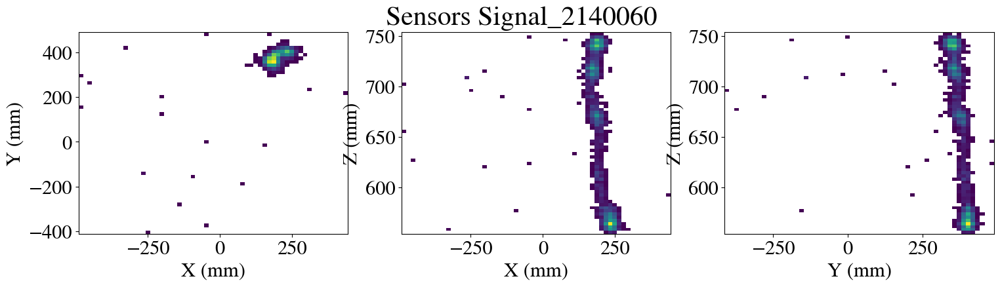

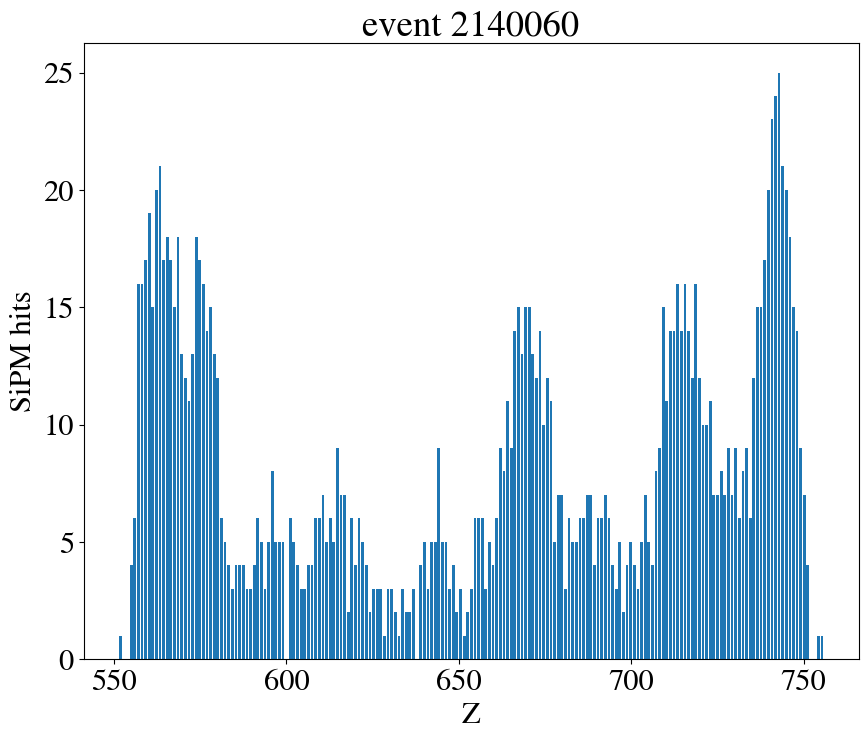

Event 2140060


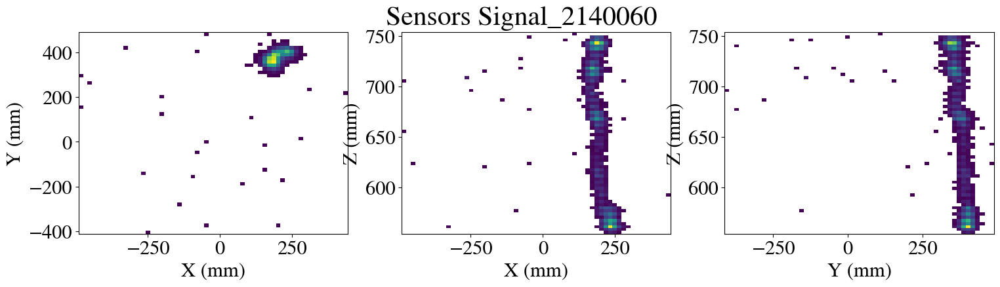

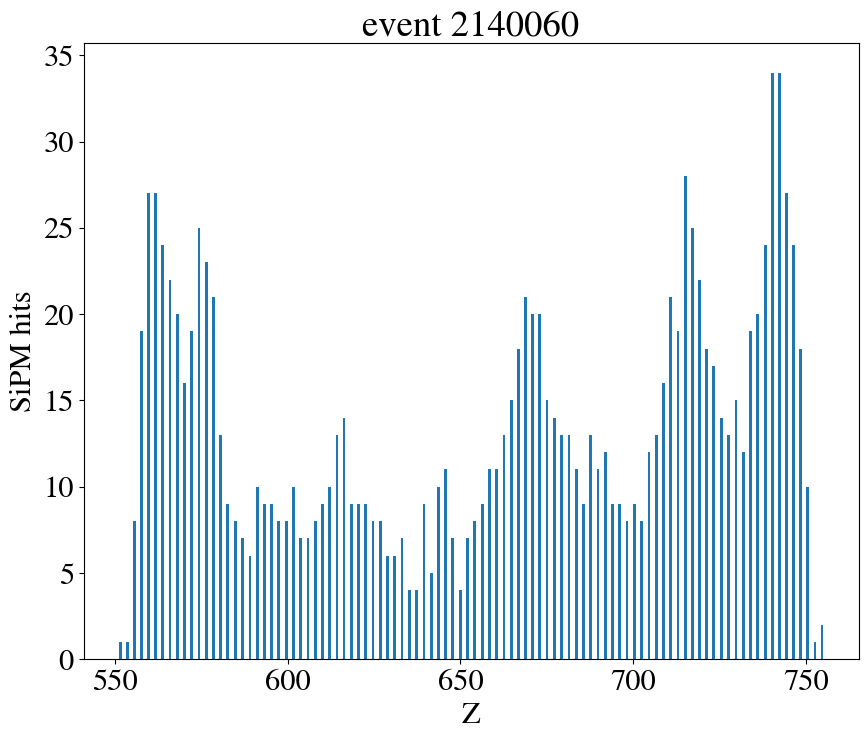

Event 2140060


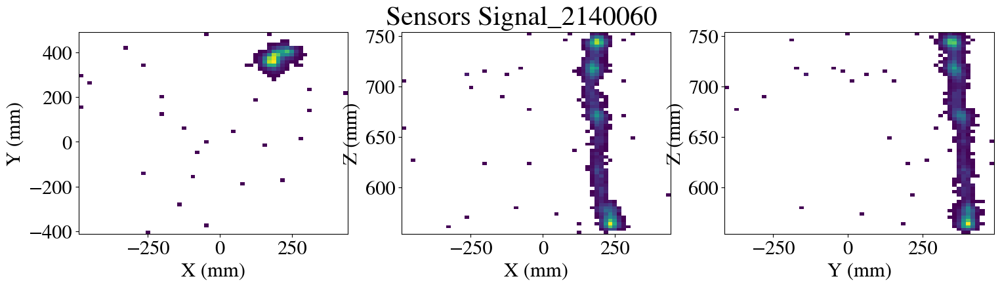

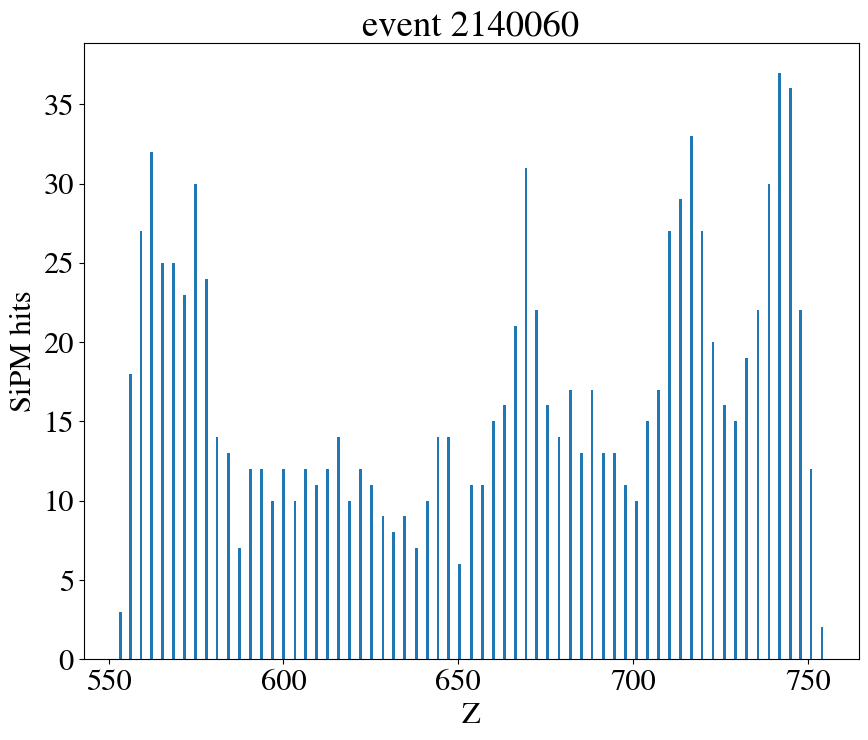

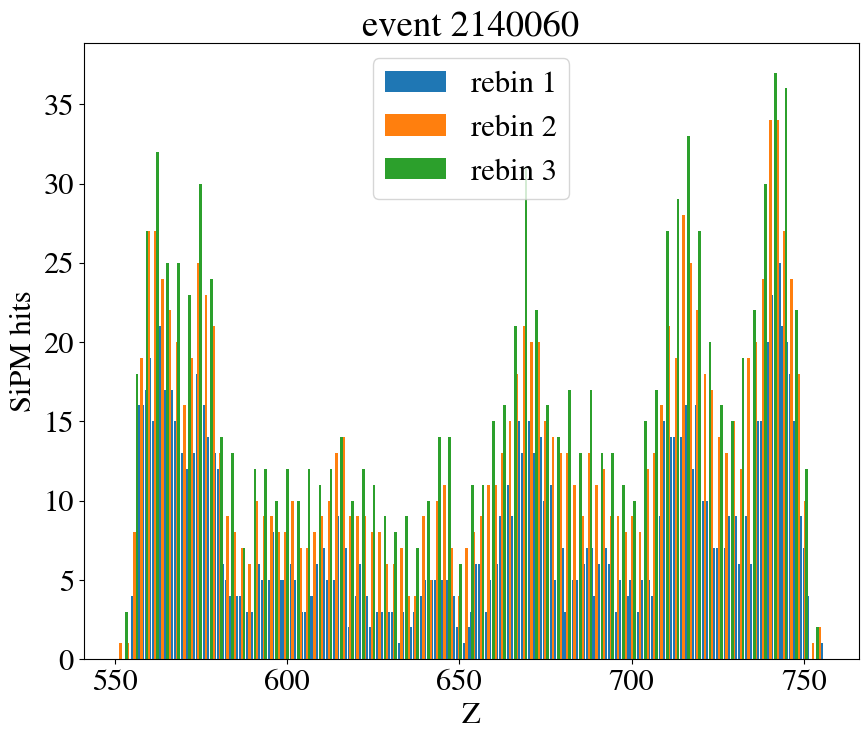

In [63]:
print("SIGNAL")
# generating the most generic xyz coords
pitch = 15.55
hits = lowTh_rebin3[lowTh_rebin3['event'] == sig_array[0]]
xx = np.arange(hits.X.min(), hits.X.max() + pitch, pitch)
yy = np.arange(hits.Y.min(), hits.Y.max() + pitch, pitch)
zz = hits.Z.unique()

create_plot(lowTh_rebin1, sig_array[0], set_bins = True, xx = xx, yy = yy, zz = zz)
create_plot(lowTh_rebin2, sig_array[0], set_bins = True, xx = xx, yy = yy, zz = zz)
create_plot(lowTh_rebin3, sig_array[0], set_bins = True, xx = xx, yy = yy, zz = zz)

sipm_hit_plot(lowTh_rebin1, lowTh_rebin2, lowTh_rebin3, 'rebin 1', 'rebin 2', 'rebin 3', sig_array[0])


SIGNAL
Event 2140138


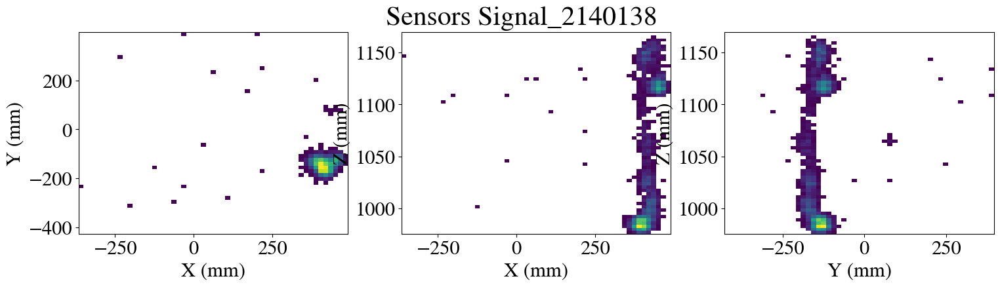

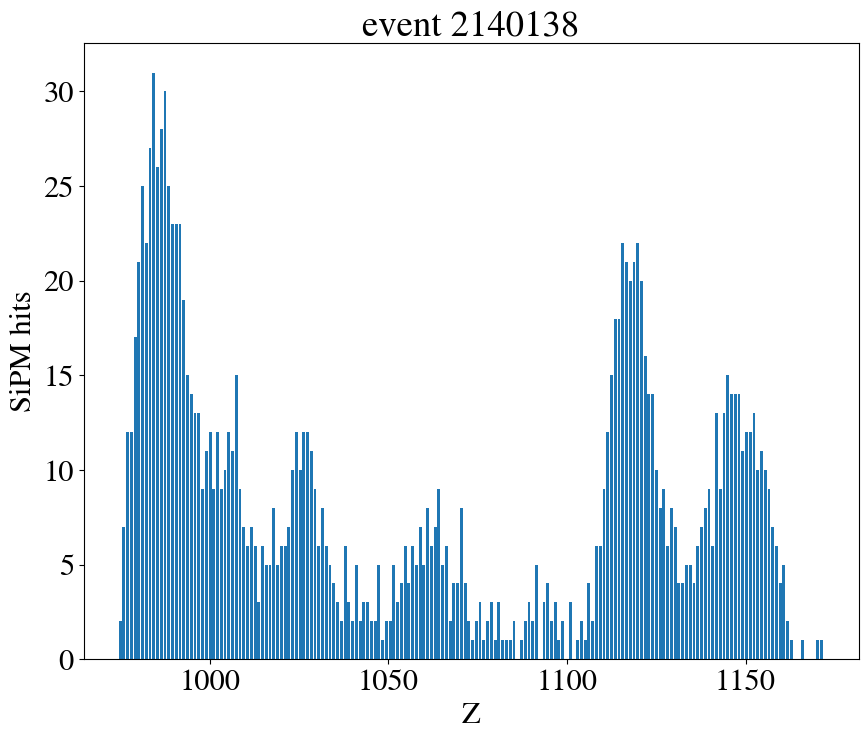

Event 2140138


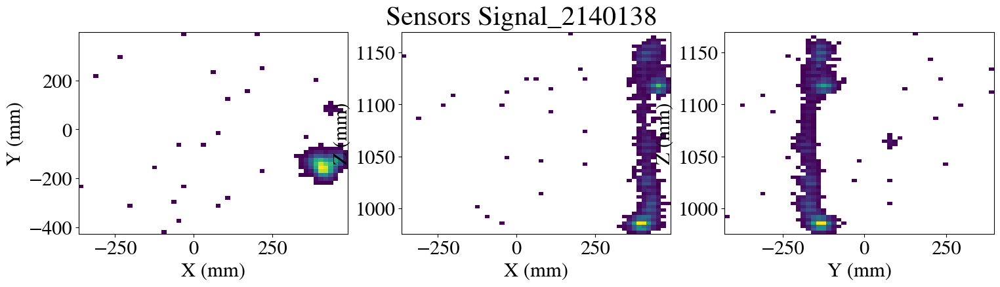

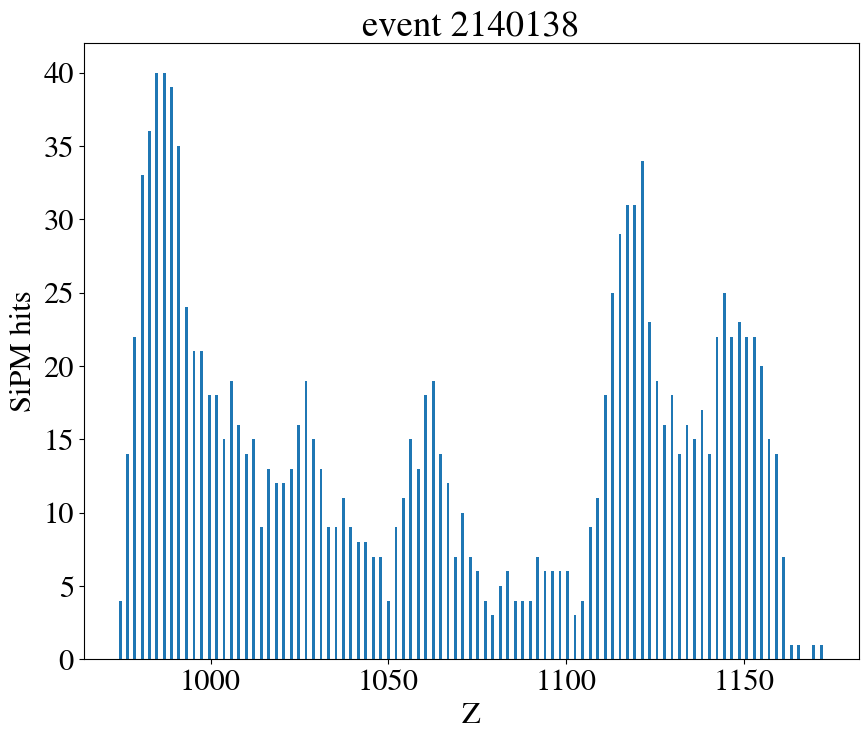

Event 2140138


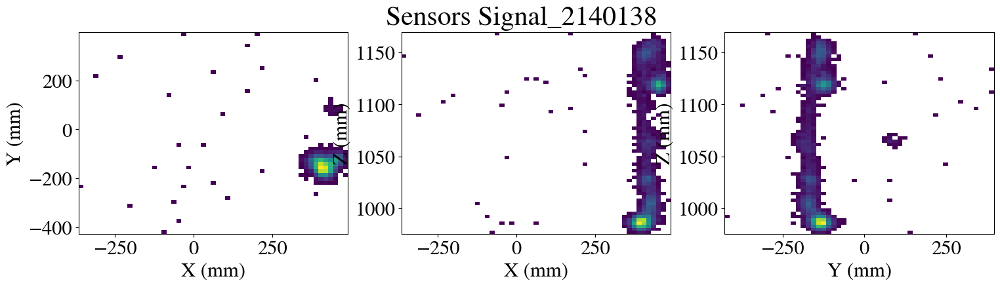

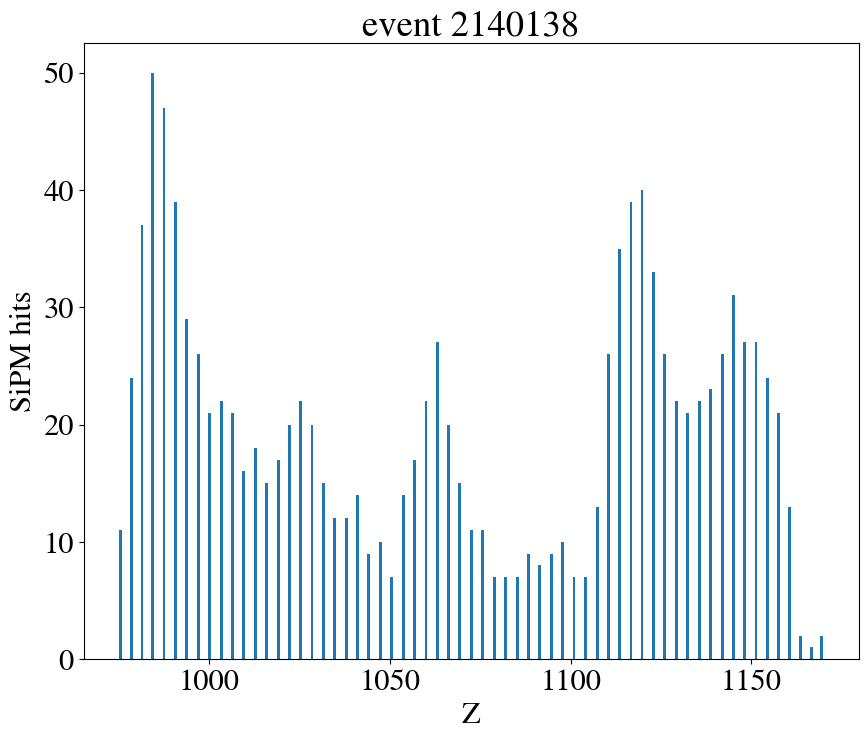

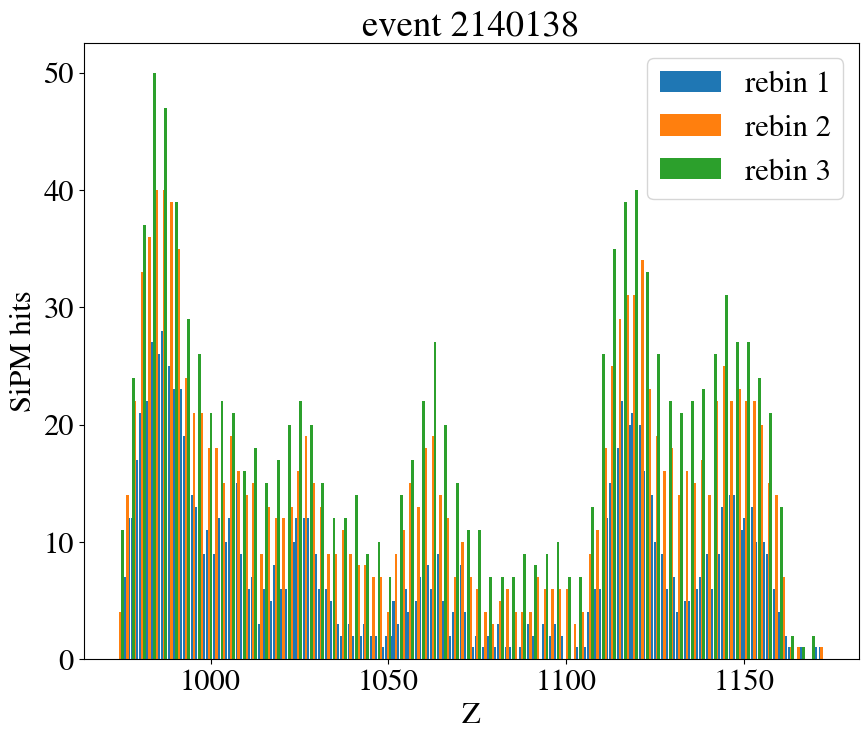

In [64]:
print("SIGNAL")
# generating the most generic xyz coords
pitch = 15.55
hits = lowTh_rebin3[lowTh_rebin3['event'] == sig_array[2]]
xx = np.arange(hits.X.min(), hits.X.max() + pitch, pitch)
yy = np.arange(hits.Y.min(), hits.Y.max() + pitch, pitch)
zz = hits.Z.unique()

create_plot(lowTh_rebin1, sig_array[2], set_bins = True, xx = xx, yy = yy, zz = zz)
create_plot(lowTh_rebin2, sig_array[2], set_bins = True, xx = xx, yy = yy, zz = zz)
create_plot(lowTh_rebin3, sig_array[2], set_bins = True, xx = xx, yy = yy, zz = zz)

sipm_hit_plot(lowTh_rebin1, lowTh_rebin2, lowTh_rebin3, 'rebin 1', 'rebin 2', 'rebin 3', sig_array[2])
